# Lung Cancer Classification using Computerized Tomography (CT) Data
### Projecto 1 - Laboratórios de IA e CD

### Ana Couto, André ?, Iara ?, Mariana Serrão

# Contexto
## Introdução - do PDF LabIACD Project 1

Dos docs dos Profes: 
"Lung cancer is at the top of cancer-related mortality numbers worldwide [Wor18, Ame19]. Only 16%
of lung cancer cases are diagnosed as local-stage tumours. In these cases, patients have a five-year
survival rate of more than 50%; however, when diagnosed in an advanced stage, the chances of a
five-year survival decrease to 5%. Thus, achieving an earlier diagnosis is critical to increase survival
rate, and systems able to provide screening support might play an important role.
As a non-invasive method, computed tomography (CT) images have shown the ability to provide
valuable information on tumour status, raising opportunities for the development of computer-aided
diagnoses (CAD) systems able to provide an automatic assessment of lung nodules malignancy risk to
help the clinical decision. Considering the use of qualitative data, factors like the high interobserver
variability associated with the visual assessment of relevant characteristics, and the amount of radiological data to be analyzed make the development of completely automatic systems a more attractive
approach [AFMH+22]. Radiomics is an emerging field that studies the extraction of mineable data
from routinely acquired medical images. The general goal of the Radiomics field is to study the features from the medical images, to improve the healthcare given to patients by creating non-invasive
diagnostic tools for the early detection of cancer."





blá

## Objetivo:

Desenvolver um modelo capaz de prever a malignidade de nódulos pulmonares com tamanho superior a 3 mm, a partir de imagens de tomografia computorizada.

# Metodologia

Adoptou-se o método CRISP-DM (CRoss Industry Standard Process for Data Mining) para execução do presente trabalho. A sexta fase do método (deployment) não foi implementada por não fazer sentido no contexto deste trabalho.

### Compreensão do domínio e adaptação do objectivo
A fase de compreensão do domínio compreendeu as tarefas de revisão da bibliografia e da documentação da base de dados (https://wiki.cancerimagingarchive.net/pages/viewpage.action?pageId=1966254), exploração de imagens da base de dados e respectivas anotações recorrendo à biblioteca pylidc.

Considerando o objectivo da tarefa, desenvolver um modelo capaz de prever a malignidade de nódulos pulmonares com tamanho superior a 3 mm, consideramos usar os casos em que a previsão de malignidade dos radiologistas foi efectivamente confirmada através dos métodos apropriados.# 

### Introdução(?)
falta:
- introducao
- graficos de comparacao dos algortimos(histogramas,roc curves

#### Bibliotecas

In [75]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.animation as manim
from skimage.measure import find_contours
import pylidc as pyl
from pylidc.utils import consensus
import SimpleITK as sitk
from radiomics import featureextractor

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

from sklearn.ensemble import StackingClassifier
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm



Partindo do documento "tcia-diagnosis-data-2012-04-20", onde constam 157 pacientes com informação de diagnóstico, seleccionaram-se os pacientes com diagnóstico "beningno" / "maligno" (independentemente de ser um nódulo maligno primário ou metástico) e cujo método de diagnóstico estava devidamente identificado. Isto reduziu a base de dados a 97 pacientes. Considerando que 13 desses pacientes tinham 2 nódulos, o nosso dataset ficaria com um total de 110 nódulos. 
Apesar da documentação do dataset (ver "Detailed description") afirmar claramente que "for a limited set of cases LIDC sites were able to identify diagnostic data associated with the case", levantou-se a dúvida sobre a correspondência se os nódulos designados 1 e 2 no documento correspondem ao 1º e 2º nódulo que aparecem nas imagens médicas do mesmo paciente. Assim, por sugestão do Professor, usaram-se as anotações dos radiologistas no que diz respeito à malignidade do nódulo. 
Convém ressalvar que desta forma o modelo desenvolvido não aprendeu a classificar as imagens de acordo com o diagnóstico do nódulo, mas de acordo com o as anotações dos radiologistas, pelo que o objectivo do modelo passa a ser prever a classificação atribuída pelo radiologista a nódulos pulmonares com tamanho superior a 3 mm com base em imagens de tomografia computorizada. Assim, não se prevê que o modelo possa melhorar a performance dos radiologistas.



### Compreensão dos dados e limpeza

Os dados foram obtidos da colecção Lung Image Database Consortium (LIDC-IDRI) e consiste de imagens representando cortes transversais da cavidade torácica obtida por tomografia computorizada (CT) e anotações das lesões encontradas. Para cada paciente incluem-se as imagens recolhidas, bem como as anotações recolhidas por 4 experientes radiologistas independentes que classificaram as lesões em nódulo / não nódulo e posteriormente reviram as suas anotações juntamente com as anotações dos outros 3 colegas com o objectivo de identificar tanto quanto possível todos os nódulos pulmonares em cada CT sem necessidade de forçar o consenso.

As imagens obtidas foram lidas e interpretadas com a biblioteca pylidc, que permitiu interpolar as anotações dos radiologistas e as imagens do dataset. Após importação das imagens foi possível explorá-las juntamente com as anotações dos radiologistas. Para cada nódulo os radiologistas atribuíram valores a cada uma das 9 características, sendo os valores discretos e ordinais ('subtlety', 'sphericity', 'margin',  'lobulation', 'spiculation', 'texture', 'malignancy') ou categóricos ('internalStructure', 'calcification').



### Preparação dos dados para modelação
A característca 'malignancy' foi usado como target e para isso calculou-se a média dos scores atribuídos pelos radiologistas, arredondou-se para o inteiro mais próximo e reduziu-se a target a duas classes: benigno (scores 1 e 2) e maligno (scores 4 e 5).

No caso de a target ser o diagnóstico obtido por biópsia, optaríamos por usar apenas radiomic features, para não envolver a subjectividade dos radiologistas de forma alguma. Como a malignancy se baseia na opinião dos radiologistas, parece fazer sentido usar também os scores por eles atribuídos. Assim, estes foram incluídos no dataset

Para extracção de features com a biblioteca pyradiomics, extraímos a região de interesse (ROI) usando o consenso do contorno dos nódulos, incluíndo a fronteira com o tecido saudável (padding) para extraír informação também da margem já que esta informação é relevante para o diagnóstico (REF, REF). A biblioteca pyradiomics foi usada para extracção de todas as features: 1ªordem, textura e volume, num total de XXX features que juntamos à média das anotações dos radiologistas.


### Modelação





### Avaliação

### Visualização dos DataSets

In [2]:
df1 = pd.read_csv('LIDC-IDRI_MetaData.csv')
df1_sorted = df1.sort_values(by='Subject ID')
df1_sorted

,Subject ID,Study UID,Study Description,Study Date,Series ID,Series Description,Number of images,File Size (Bytes),Collection Name,Modality,Manufacturer
348,LIDC-IDRI-0001,1.3.6.1.4.1.14519.5.2.1.6279.6001.298806137288...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.179049373636...,NaN,133,70018838,LIDC-IDRI,CT,GE MEDICAL SYSTEMS
186,LIDC-IDRI-0001,1.3.6.1.4.1.14519.5.2.1.6279.6001.175012972118...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.141365756818...,NaN,2,16357620,LIDC-IDRI,DX,GE MEDICAL SYSTEMS
1100,LIDC-IDRI-0002,1.3.6.1.4.1.14519.5.2.1.6279.6001.116951808801...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.493562949900...,NaN,1,6909958,LIDC-IDRI,DX,GE MEDICAL SYSTEMS
1141,LIDC-IDRI-0002,1.3.6.1.4.1.14519.5.2.1.6279.6001.490157381160...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.619372068417...,NaN,261,137396696,LIDC-IDRI,CT,GE MEDICAL SYSTEMS
189,LIDC-IDRI-0003,1.3.6.1.4.1.14519.5.2.1.6279.6001.202063331127...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.142026812390...,NaN,5,38580794,LIDC-IDRI,DX,GE MEDICAL SYSTEMS
...,...,...,...,...,...,...,...,...,...,...,...
990,LIDC-IDRI-1008,1.3.6.1.4.1.14519.5.2.1.6279.6001.339975625902...,NaN,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.332510758903...,NaN,115,60517648,LIDC-IDRI,CT,TOSHIBA
1248,LIDC-IDRI-1009,1.3.6.1.4.1.14519.5.2.1.6279.6001.849069697860...,CT THORAX W/CONTRAST,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.855232435861...,Recon 2: CHEST,125,65830674,LIDC-IDRI,CT,GE MEDICAL SYSTEMS
1120,LIDC-IDRI-1010,1.3.6.1.4.1.14519.5.2.1.6279.6001.145373944605...,CT ANGIO CHEST (NON-CO,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.550599855064...,BOTTOM TO TOP,252,132720966,LIDC-IDRI,CT,GE MEDICAL SYSTEMS
749,LIDC-IDRI-1011,1.3.6.1.4.1.14519.5.2.1.6279.6001.287560874054...,CT THORAX W/CONTRAST,2000-01-01 00:00:00.0,1.3.6.1.4.1.14519.5.2.1.6279.6001.272123398257...,CHEST,133,70030058,LIDC-IDRI,CT,GE MEDICAL SYSTEMS


Este dataset contém informações relativas às imagens radiógicas, as quais não são relevantes ao estudo dos nódulos em si.

In [3]:
df2 = pd.read_excel('lidc-idri nodule counts (6-23-2015).xlsx')
df2_sorted = df2.sort_values(by='TCIA Patent ID')
df2_sorted

,TCIA Patent ID,Total Number of Nodules*,Number of Nodules >=3mm**,Number of Nodules <3mm***,Unnamed: 4,Unnamed: 5
0,LIDC-IDRI-0001,4,1,3,NaN,NaN
1,LIDC-IDRI-0002,12,1,11,NaN,*total number of lesions that received either ...
2,LIDC-IDRI-0003,4,4,0,NaN,"**total number of lesions that received a ""nod..."
3,LIDC-IDRI-0004,4,1,3,NaN,"***total number of lesions that received a ""no..."
4,LIDC-IDRI-0005,9,3,6,NaN,NaN
...,...,...,...,...,...,...
1014,LIDC-IDRI-1009,2,1,1,NaN,NaN
1015,LIDC-IDRI-1010,10,1,9,NaN,NaN
1016,LIDC-IDRI-1011,4,4,0,NaN,NaN
1017,LIDC-IDRI-1012,1,1,0,NaN,NaN


Este segundo dataset é também irrelevante para o nosso estudo uma vez que não contém informações de cada nódulo.

In [4]:
df3 = pd.read_excel('tcia-diagnosis-data-2012-04-20.xls')
df3_sorted = df3.sort_values(by='TCIA Patient ID')
df3_sorted

,TCIA Patient ID,"Diagnosis at the Patient Level\n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic\n",Diagnosis Method\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response,Primary tumor site for metastatic disease,"Nodule 1\nDiagnosis at the Nodule Level \n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic)\n",Nodule 1\nDiagnosis Method at the Nodule Level\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response\n,"Nodule 2\nDiagnosis at the Nodule Level \n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic)\n",Nodule 2\nDiagnosis Method at the Nodule Level\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response\n,"Nodule 3\nDiagnosis at the Nodule Level \n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic)\n",Nodule 3\nDiagnosis Method at the Nodule Level\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response\n,"Nodule 4\nDiagnosis at the Nodule Level \n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic)\n",Nodule 4\nDiagnosis Method at the Nodule Level\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response\n,"Nodule 5\nDiagnosis at the Nodule Level \n0=Unknown\n1=benign or non-malignant disease\n2= malignant, primary lung cancer\n3 = malignant metastatic)\n",Nodule 5\nDiagnosis Method at the Nodule Level\n0 = unknown\n1 = review of radiological images to show 2 years of stable nodule\n2 = biopsy\n3 = surgical resection\n4 = progression or response\n
0,LIDC-IDRI-0068,3,4,Head & Neck Cancer,3.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,LIDC-IDRI-0071,3,1,Head & Neck,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LIDC-IDRI-0072,2,4,Lung Cancer,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LIDC-IDRI-0088,3,0,Uterine Cancer,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,LIDC-IDRI-0090,2,3,NSCLC,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,LIDC-IDRI-0994,2,3,LUL Large cell CA,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
153,LIDC-IDRI-1002,2,2,non-small cell carcinoma,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
154,LIDC-IDRI-1004,2,3,LUL NSCLC,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
155,LIDC-IDRI-1010,0,0,lymphoma,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


A uma primeira análise, considerámos este dataset importante para o nosso projeto. A coluna "Diagnosis at the Patient Level..." poderia ser considerada como a nossa target, e as colunas "Nodule 1\nDiagnosis at the Nodule Level..." e "Nodule 2\nDiagnosis at the Nodule Level..." pareceram-nos também conter informações importantes. Contudo, na extração de features com pylidc, ficamos na dúvido se as informações relativamente ao nódulo 1, por exemplo, iriam corresponder ao mesmo nódulo 1 do pylidc. Desta maneira, optamos por descartar também este dataset e criar um apenas com as features extraídas com pylidc e pyradiomics.

## Pylidc

Por forma a conseguirmos trabalhar melhor com o pylidic, numa primeira fase, seguimos e testámos os tutoriais apresentados no website oficial https://pylidc.github.io/#tutorials

### 1. Classe Scan

In [175]:
# Todos os CT scans com espessura de corte menor ou igual a 1 e um espaçamento de pixel menor ou igual a 0.6
scans = pyl.query(pyl.Scan).filter(pyl.Scan.slice_thickness <= 1, pyl.Scan.pixel_spacing <= 0.6)
print(scans.count())

#CT do paciente com o id LIDC-IDRI-0068
pid = 'LIDC-IDRI-0068'
scan = pyl.query(pyl.Scan).filter(pyl.Scan.patient_id == pid).first()
print(scan)

31
Scan(id=79,patient_id=LIDC-IDRI-0068)


In [176]:
#Numero de anotações do paciente 0068
print(len(scan.annotations))

#Nodulos do paciente
nods = scan.cluster_annotations()

#Quantidade de nodulos do paciente
print("%s has %d nodules." % (scan, len(nods)))

#Número de anotações por nodulo do paciente
for i,nod in enumerate(nods):
    print("Nodule %d has %d annotations." % (i+1, len(nods[i])))

22
Scan(id=79,patient_id=LIDC-IDRI-0068) has 6 nodules.
Nodule 1 has 4 annotations.
Nodule 2 has 4 annotations.
Nodule 3 has 4 annotations.
Nodule 4 has 2 annotations.
Nodule 5 has 4 annotations.
Nodule 6 has 4 annotations.


In [177]:
#Converte o scan num array NumPy para processamento da imagem
vol = scan.to_volume()
print(vol.shape)

Loading dicom files ... This may take a moment.
(512, 512, 261)


Loading dicom files ... This may take a moment.


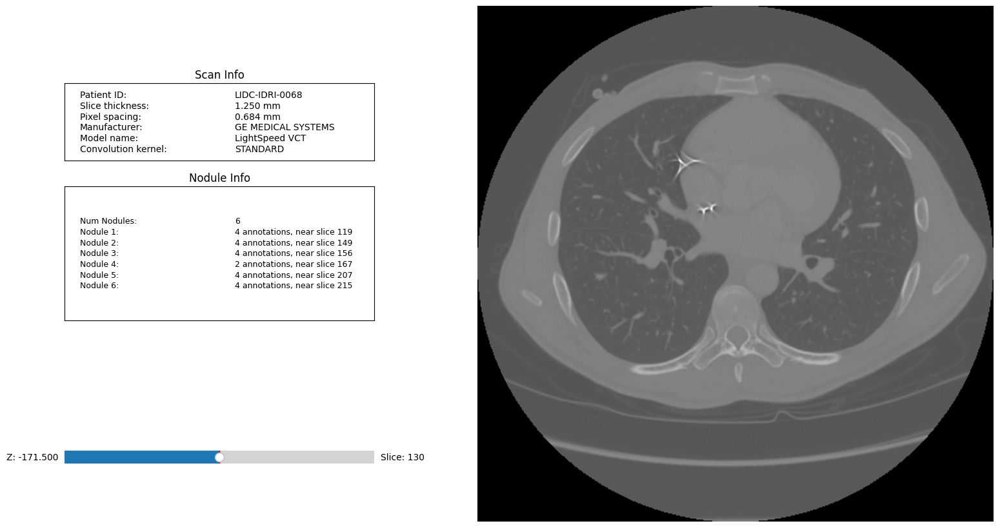

In [178]:
scan.visualize(annotation_groups=nods)

### 2. Classe Anotações

In [179]:
#Primeira anotação de todas no geral
ann = pyl.query(pyl.Annotation).first()

#Paciente com a primeira anotação
print(ann.scan.patient_id)

#Anotações do paciente 0068
anns = scan.annotations

#Número de anotações do paciente 0068
print(len(anns))

#Primeira anotação do paciente 0068
ann = scan.annotations[0]

LIDC-IDRI-0078
22


In [180]:
#Anotações com spiculation e malignancy igual a 5
anns = pyl.query(pyl.Annotation).filter(pyl.Annotation.spiculation == 5,pyl.Annotation.malignancy == 5)

#Numero de anotações que atendem aos critérios acima
print(anns.count())

91


In [181]:
#Primeira anotação com malignidade igual a 5
ann = pyl.query(pyl.Annotation).filter(pyl.Annotation.malignancy == 5).first()

#Nível de malignancy: malignancy -> formato número; Malignancy -> formato texto
print(ann.malignancy, ann.Malignancy)

#Margem: margin -> formato número; Margin -> formato texto
print(ann.margin, ann.Margin)
# => 2, 'Near Poorly Defined'

#Todas as características que podem ser vistas
print(pyl.annotation_feature_names)

#Tabela com todas as características da anotação
ann.print_formatted_feature_table()

5 Highly Suspicious
2 Near Poorly Defined
('subtlety', 'internalStructure', 'calcification', 'sphericity', 'margin', 'lobulation', 'spiculation', 'texture', 'malignancy')
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid/Round              | 4 
Margin             | Near Poorly Defined      | 2 
Lobulation         | Near Marked Lobulation   | 4 
Spiculation        | No Spiculation           | 1 
Texture            | Solid                    | 5 
Malignancy         | Highly Suspicious        | 5 


In [182]:
#Primeira anotação
ann = pyl.query(pyl.Annotation).first()

#Contornos da anotação (nódulo) numa única fatia (slice)
contours = ann.contours

#Número de contornos
print(len(contours))

#diâmetro, área e volume do nódulo
print("%.2f mm, %.2f mm^2, %.2f mm^3" % (ann.diameter, ann.surface_area,ann.volume))

#A máscara é usada para segmentar a região de interesse na imagem
mask = ann.boolean_mask()

#imprime a forma (alt, larg, prof) e o tipo da máscara
print(mask.shape, mask.dtype)

6
20.84 mm, 1124.13 mm^2, 2439.30 mm^3
(34, 27, 6) bool


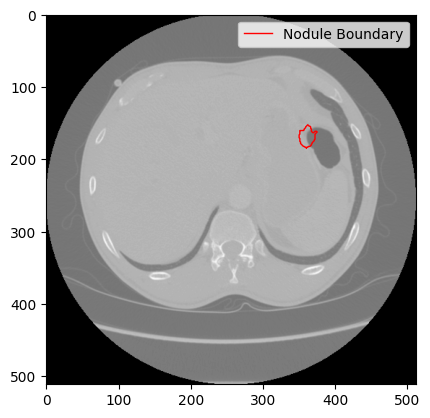

In [183]:
#Primeiro contorno do nodulo
con = ann.contours[0]

#Visualizar contorno
k = con.image_k_position
ii,jj = ann.contours[3].to_matrix(include_k=False).T

plt.imshow(vol[:,:,46], cmap=plt.cm.gray)
plt.plot(jj, ii, '-r', lw=1, label="Nodule Boundary")
plt.legend()
plt.show()

In [184]:
#Paciente 0068
scan = pyl.query(pyl.Scan).filter(pyl.Scan.patient_id == pid).first()

#Primeira anotação do paciente 0068
ann = scan.annotations[0]
# Caixa delimitadora que engloba a região de interesse (ROI)
# A saída contém três slices, cada uma representa a dimensão da caixa ao longo de um eixo (X,Y,Z)
bbox = ann.bbox()
print(bbox)

# cria um volume 3D a partir de um objeto de anotação médica (ann) e imprime a forma
vol = ann.scan.to_volume()
print(vol[bbox].shape)

(slice(194, 215, None), slice(147, 167, None), slice(210, 220, None))
Loading dicom files ... This may take a moment.
(21, 20, 10)


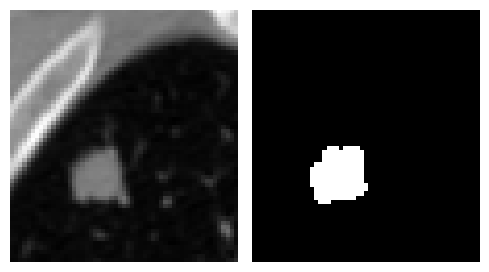

In [185]:
# Valor de preenchimento (padding) para a largura, altura e profundidade 
padding = [(30,10), (10,25), (0,0)]

# Máscara booleana que destaca a região de interesse (ROI) usando o padding
mask = ann.boolean_mask(pad=padding)

# Calcula a caixa delimitadora que envolve a região de interesse (ROI)
bbox = ann.bbox(pad=padding)

fig,ax = plt.subplots(1,2,figsize=(5,3))

ax[0].imshow(vol[bbox][:,:,2], cmap=plt.cm.gray)
ax[0].axis('off')

ax[1].imshow(mask[:,:,2], cmap=plt.cm.gray)
ax[1].axis('off')

plt.tight_layout()
plt.show()

Loading dicom files ... This may take a moment.


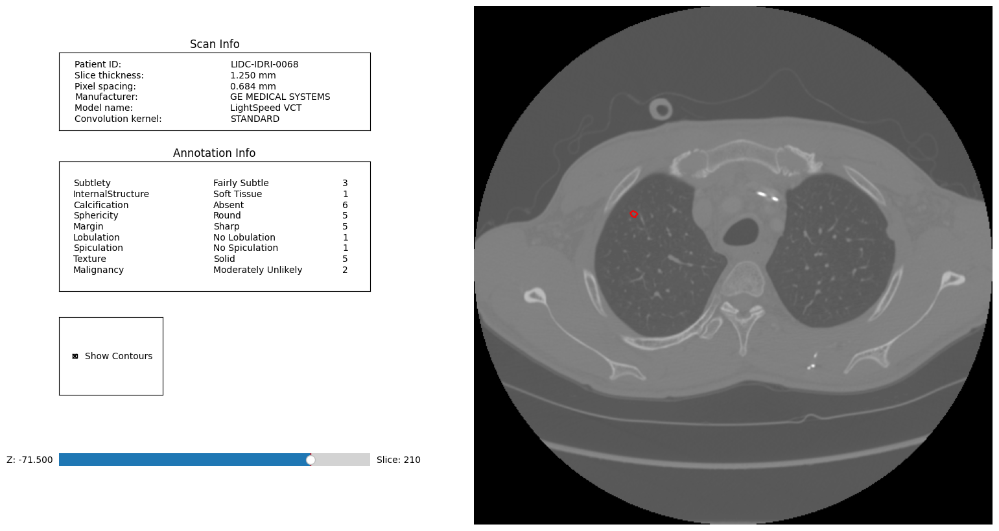

In [186]:
#Visualiza a anotação dentro do contexto do volume de CT em que foi identificada
ann.visualize_in_scan()

In [187]:
ann.visualize_in_3d()

AttributeError: module 'matplotlib.cm' has no attribute 'cmap_d'

### 3. Anotações - Consenso

Loading dicom files ... This may take a moment.
Nódulo 1


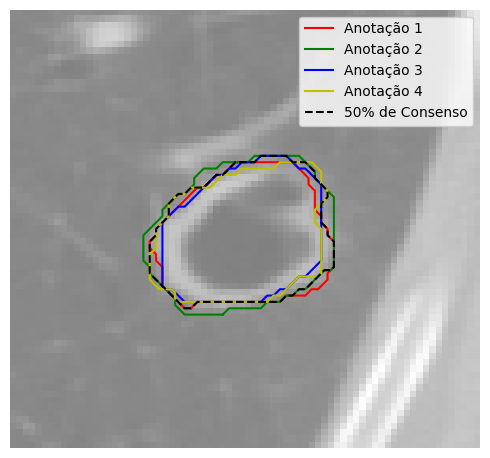

Nódulo 2


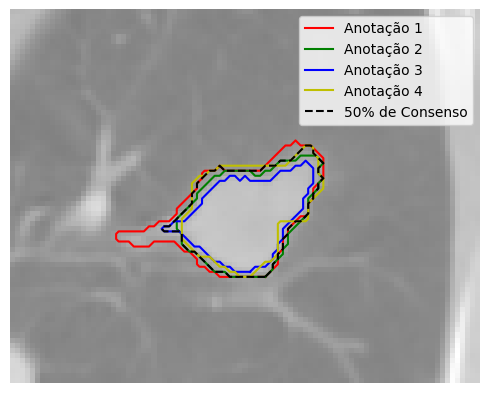

Nódulo 3


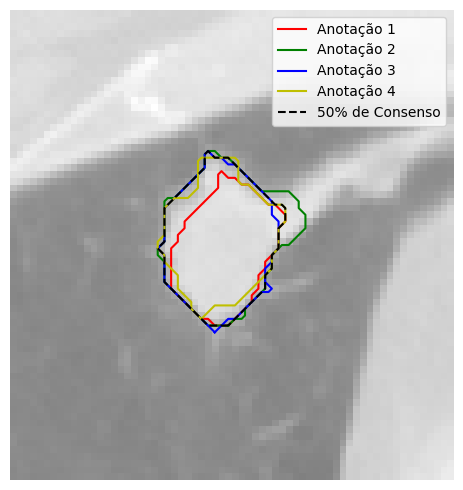

Nódulo 4


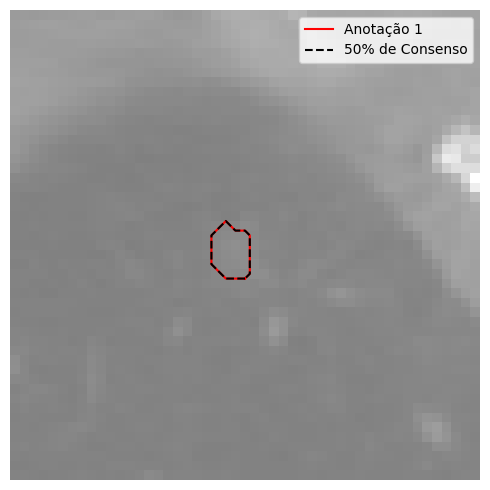

In [189]:
import numpy as np
import matplotlib.animation as manim
from skimage.measure import find_contours
from pylidc.utils import consensus

pid = 'LIDC-IDRI-1011'
#CT do paciente com o id LIDC-IDRI-0068
scan = pyl.query(pyl.Scan).filter(pyl.Scan.patient_id == pid).first()

#Converte o scan num array NumPy para processamento da imagem
vol = scan.to_volume()

# Clusteriza as anotações para um nódulo específico
nods = scan.cluster_annotations()
for i in range(len(nods)):
    print('Nódulo', i+1)
    anns = nods[i]  # Seleciona as anotações para o primeiro nódulo

    # Calcula o consenso das anotações com um nível de consenso de 50% e padding
    cmask, cbbox, masks = consensus(anns, clevel=0.5, pad=[(20, 20), (20, 20), (0, 0)])
    
    # Seleciona a fatia do meio (slice) no eixo z
    k = int(0.5 * (cbbox[2].stop - cbbox[2].start))

    # Cria uma figura e um eixo para plotagem
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))

    # Mostra a fatia do volume de TC com um mapa de cores em tons de cinza
    ax.imshow(vol[cbbox][:, :, k], cmap=plt.cm.gray, alpha=0.5)

    # Cores para as diferentes anotações
    colors = ['r', 'g', 'b', 'y']
        
    # Plota os contornos das anotações originais para a kº slice
    for j in range(len(masks)):
        for c in find_contours(masks[j][:, :, k].astype(float), 0.5):
            label = "Anotação %d" % (j+1)
            plt.plot(c[:, 1], c[:, 0], colors[j], label=label)

    # Plota o contorno do consenso de 50%
    for c in find_contours(cmask[:, :, k].astype(float), 0.5):
        plt.plot(c[:, 1], c[:, 0], '--k', label='50% de Consenso')

    # Configurações adicionais para a plotagem
    ax.axis('off')
    ax.legend()
    plt.tight_layout()
    plt.show()

### Análise a exemplos particulares 

Nódulo  1
Loading dicom files ... This may take a moment.


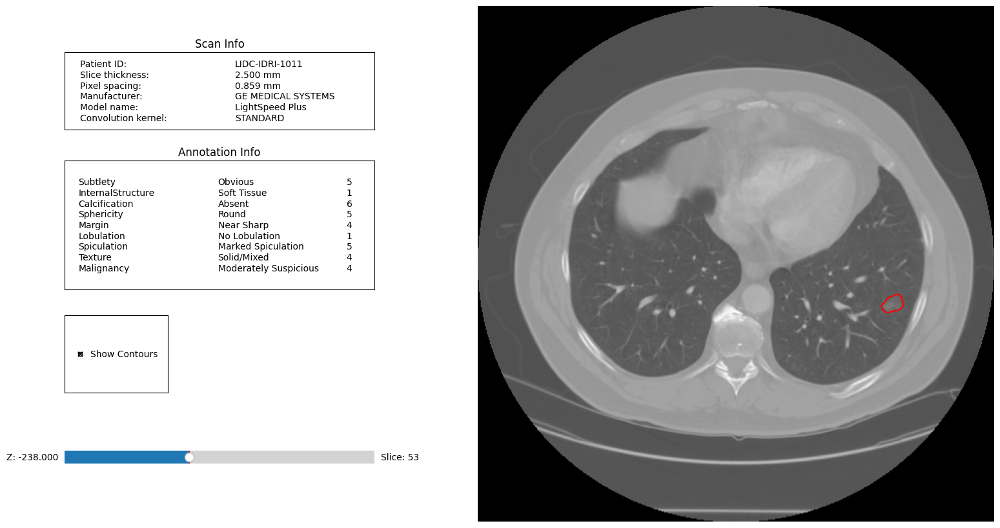

Loading dicom files ... This may take a moment.


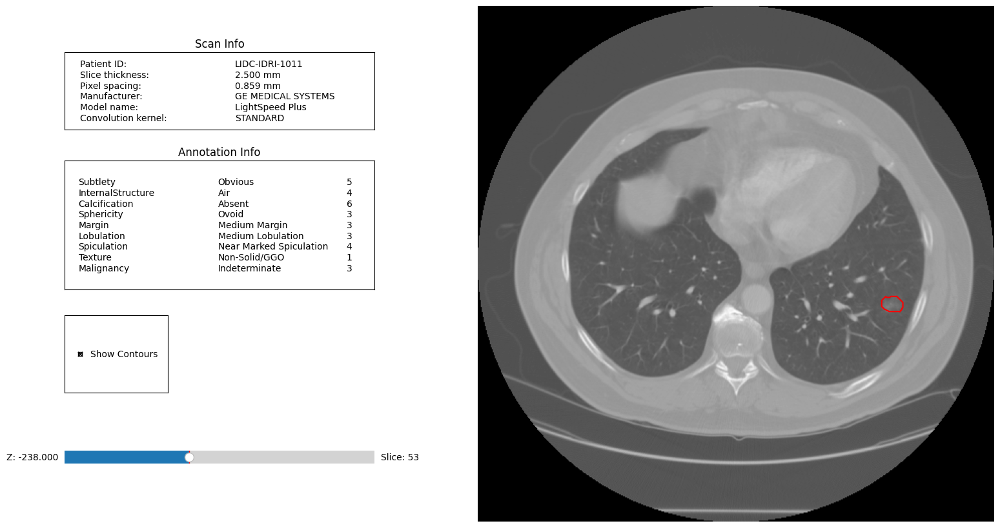

Loading dicom files ... This may take a moment.


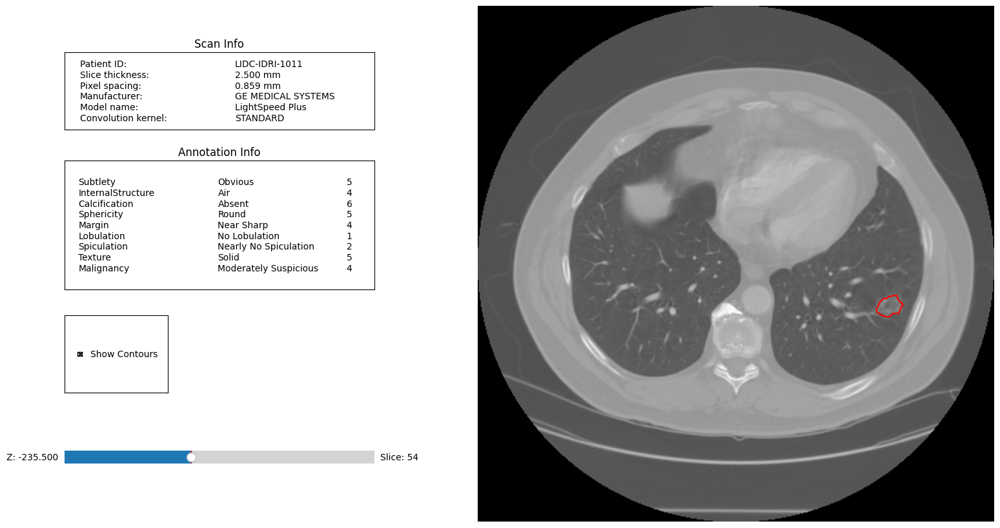

Loading dicom files ... This may take a moment.


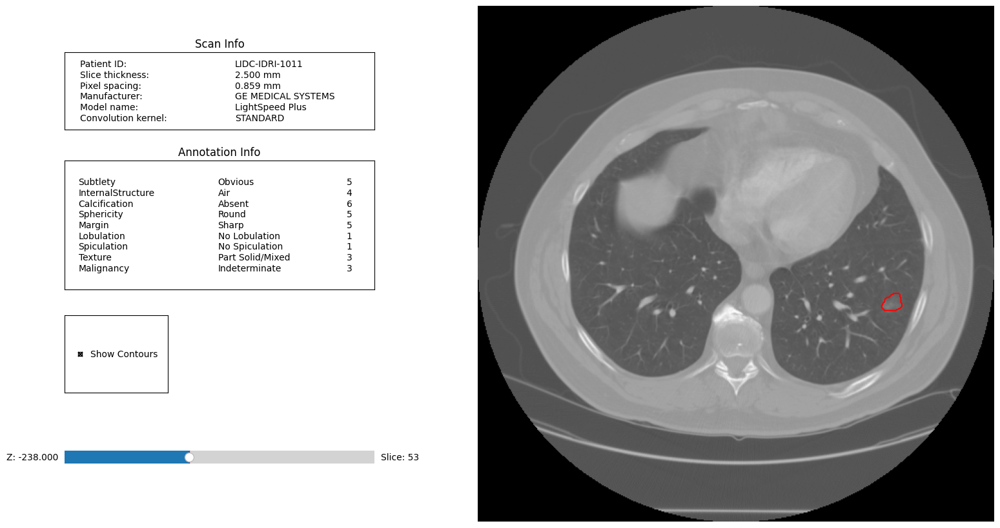

Nódulo  2
Loading dicom files ... This may take a moment.


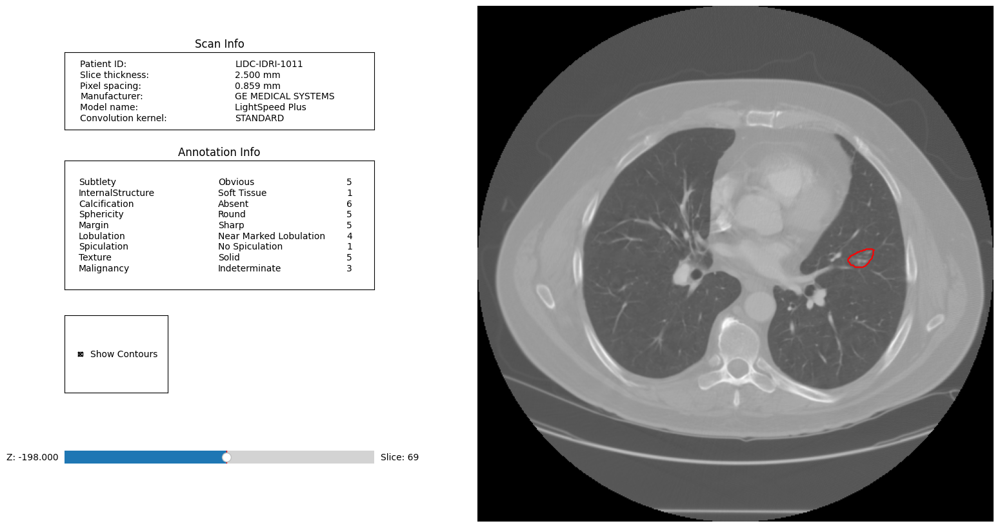

Loading dicom files ... This may take a moment.


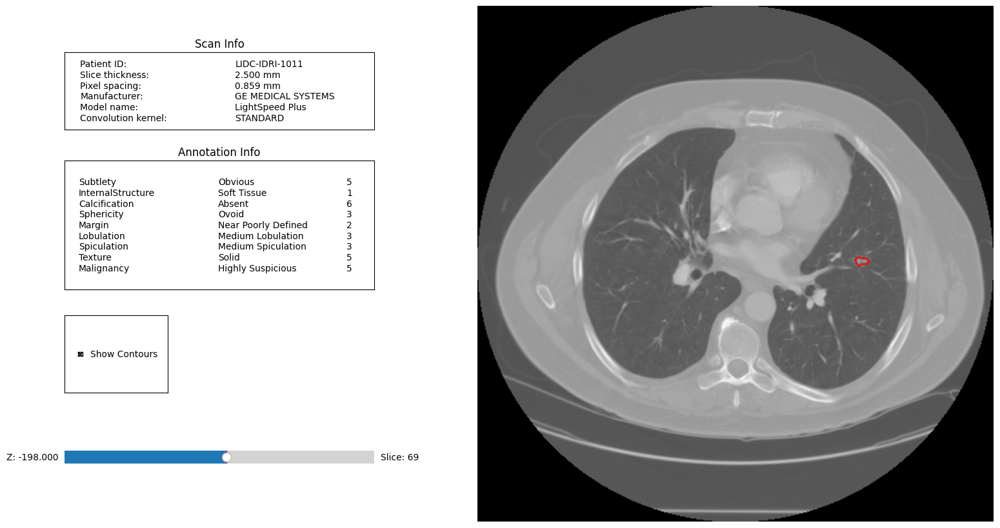

Loading dicom files ... This may take a moment.


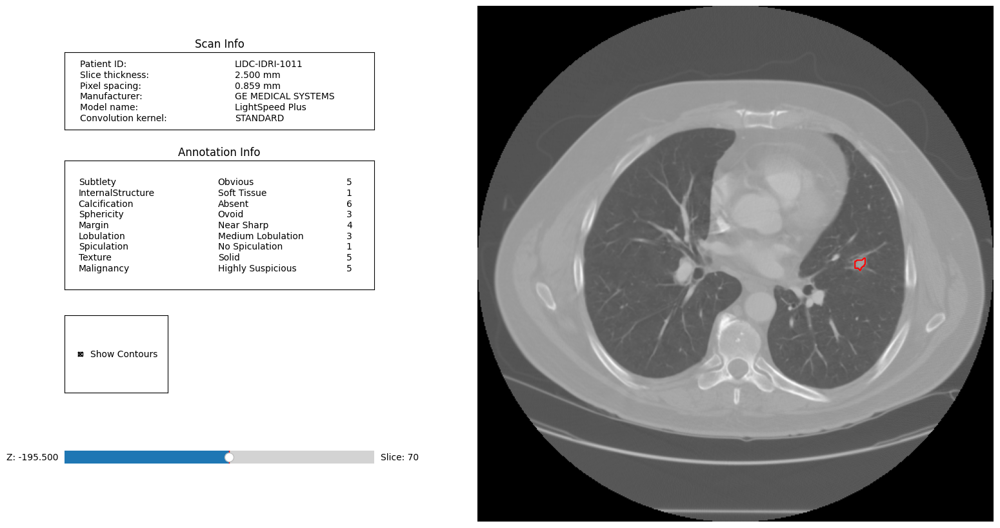

Loading dicom files ... This may take a moment.


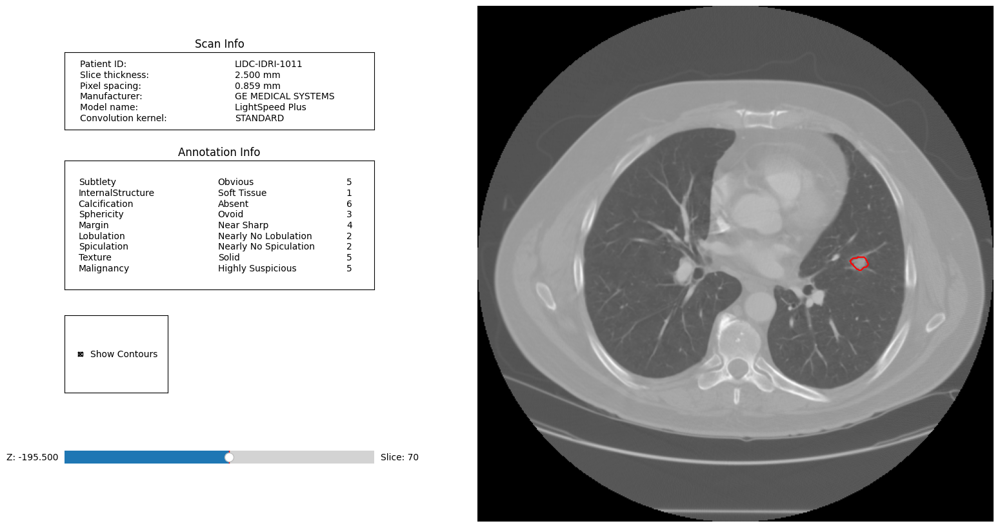

Nódulo  3
Loading dicom files ... This may take a moment.


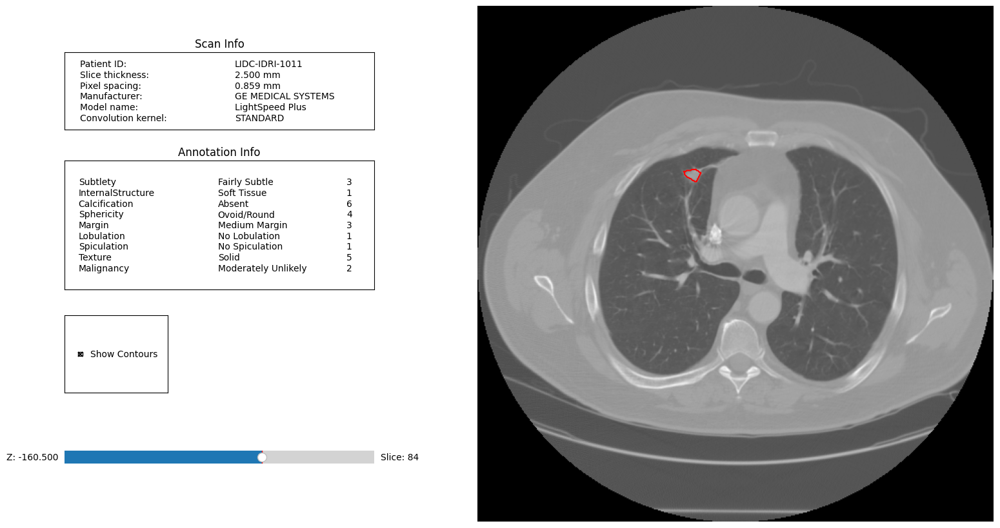

Loading dicom files ... This may take a moment.


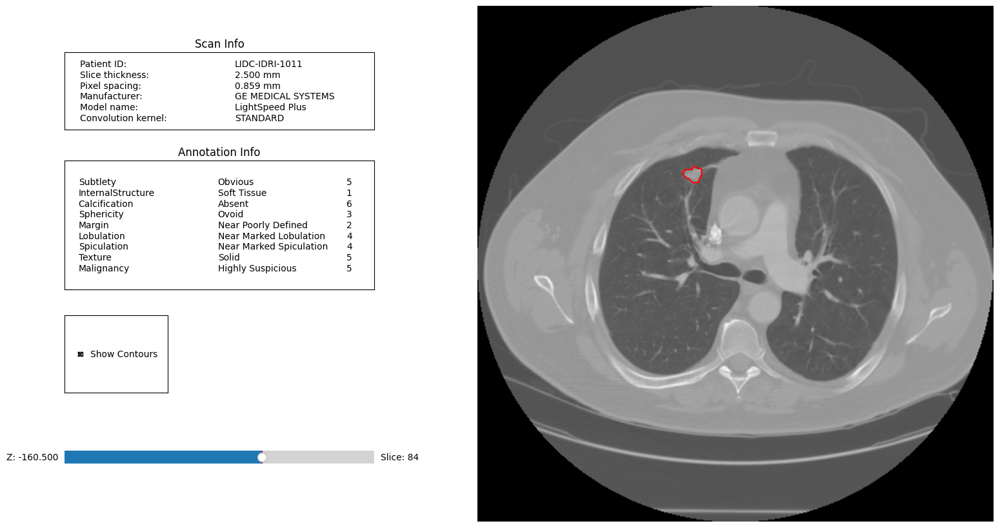

Loading dicom files ... This may take a moment.


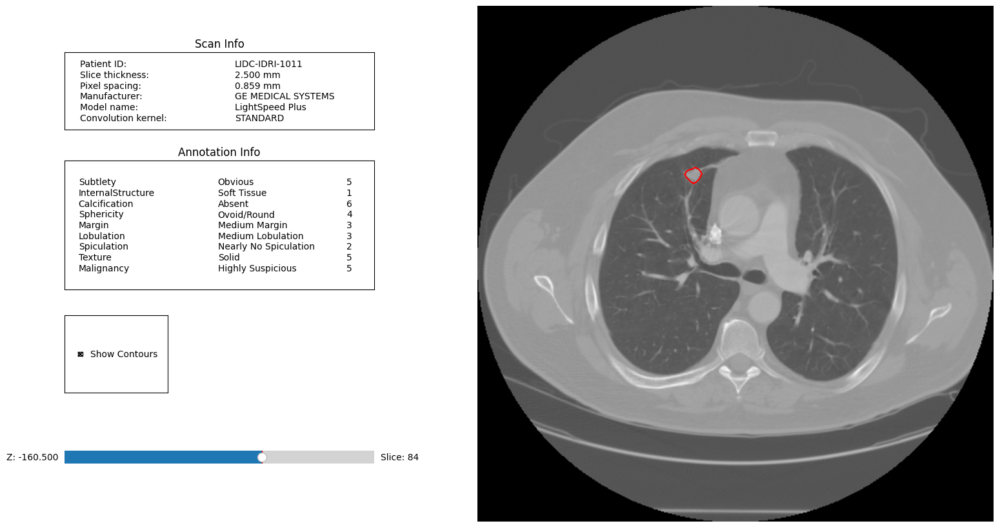

Loading dicom files ... This may take a moment.


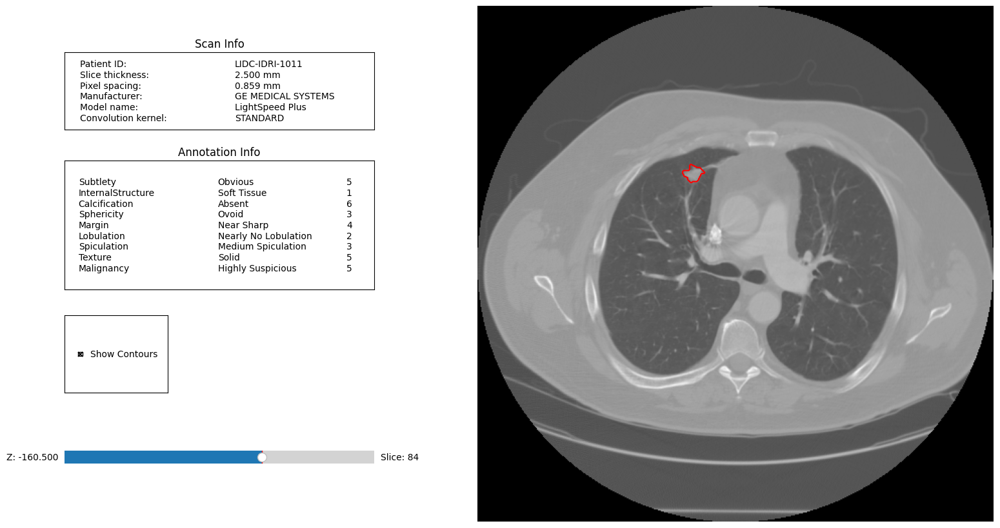

Nódulo  4
Loading dicom files ... This may take a moment.


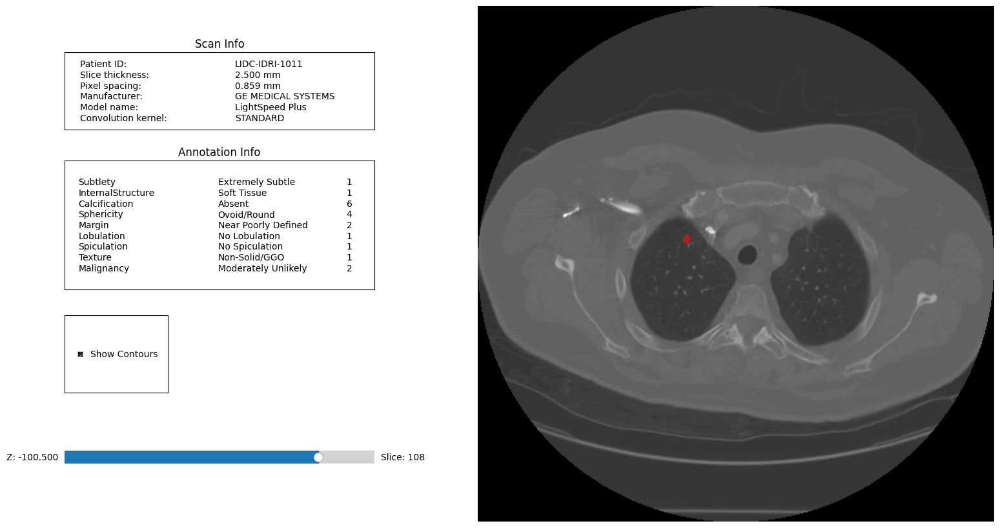

In [190]:
pid = 'LIDC-IDRI-1011'
#CT do paciente com o id LIDC-IDRI-0068
scan = pyl.query(pyl.Scan).filter(pyl.Scan.patient_id == pid).first()

# Clusteriza as anotações para um nódulo específico
nods = scan.cluster_annotations()
i = 1
for anns in nods:
    print('Nódulo ', i)
    for ann in anns:
        ann.visualize_in_scan()
    i +=1

Através desta análise, conseguimos visualizar a localização dos vários nódulos em cada paciente, percebendo as ligeiras diferenças na representação em cada anotação. Esta torna-se assim uma base do nosso trabalho já que abre caminho ao estudo generalizado, permitindo perceber o funcionamento de cada uma das bibliotecas e até de alguns problemas que estas nos possam trazer ao longo deste.

### 4. Queries Avançadas

### Resultado aleatório

In [191]:
from sqlalchemy import func

# Todos os nódulos altamente suspeitos
anns = pyl.query(pyl.Annotation).filter(pyl.Annotation.malignancy == 5)

#Ordena-se os resultados de forma aleatória e pega-se no primeiro resultado
ann = anns.order_by(func.random()).first()
print(ann.id, ann.Malignancy)

ann = anns.order_by(func.random()).first()
print(ann.id, ann.Malignancy)

3320 Highly Suspicious
415 Highly Suspicious


### Consultar vários parâmetros de modelos com uma junção

In [192]:
#Número de anotações com valor de malignidade não indeterminado
anns = pyl.query(pyl.Annotation).filter(pyl.Annotation.malignancy != 3)
print(anns.count())

#Número de scans com espessura de corte inferior a 1 mm
scans = pyl.query(pyl.Scan).filter(pyl.Scan.slice_thickness < 1)
print(scans.count())

# Consulta-se uma anotação que seja limitado pelos parâmetros do seu exame correspondente (Scan)
# Neste caso, pega em todas as anotações com um valor de malignidade não indeterminado (pyl.Annotation.malignancy != 3)
# e cujo exame correspondente tenha espessura de corte inferior a 1 mm (pyl.Scan.slice_thickness < 1).
anns = pyl.query(pyl.Annotation).join(pyl.Scan).filter(pyl.Scan.slice_thickness < 1, pyl.Annotation.malignancy != 3)
print(anns.count())

4253
39
181


### Filtrar com a cláusula "in"

In [193]:
#O objetivo é contar o número total de anotações pertencentes aos exames na consulta anterior

#Método 1: percorrer todos os exames e somar o número de anotações pertencentes a cada um deles
scans = pyl.query(pyl.Scan).filter(pyl.Scan.slice_thickness < 1)
n_anns = sum([len(scan.annotations) for scan in scans])
print(n_anns)

#Método 2: consultar todas as anotações cujo atributo scan_id seja um ID presente na lista de IDs dos exames
sids = [scan.id for scan in scans]
anns = pyl.query(pyl.Annotation).filter(pyl.Annotation.scan_id.in_(sids))
print(anns.count())

300
300


### Agrupar nódulos com atributos semelhantes

In [194]:
from sqlalchemy import func

# Obter uma lista dos atributos. Também podíamos listá-los todos na consulta, ou seja,
# pyl.Annotation.spiculation, pyl.Annotation.malignancy, etc...
todos_os_atributos = [getattr(pyl.Annotation, nome_atributo)
                    for nome_atributo in pyl.annotation_feature_names]

grupos = pyl.query(func.group_concat(pyl.Annotation.id)).group_by( *todos_os_atributos ).having(func.count('*') > 1)

#Número de grupos de anotações de nódulos cujos membros do grupo têm valores de características idênticos
print(grupos.count())

#Imprime tuplas de 1 elemento cujo elemento é uma string de IDs de Anotações, separados por vírgulas
print(grupos[0], grupos[1])

# IDs do primeiro grupo:
ids = grupos[0][0].split(',')

for id in ids:
    ann = pyl.query(pyl.Annotation).get(id)
    #Para cada id imprime os valores das características
    print(ann.feature_vals())

837
('6764,6766',) ('5781,5782,5937',)
[1 1 3 3 5 1 1 5 1]
[1 1 3 3 5 1 1 5 1]


In [195]:
import numpy as np

#Cria lista com o tamanho de cada grupo
tamanhos_do_grupo = [len(g[0].split(',')) for g in grupos]

#Imprime o tamanho do grupo com mais ids
print(max(tamanhos_do_grupo))

# Obtém a localização do grupo de maior tamanho.
i = np.argmax(tamanhos_do_grupo)

# Primeiro ID no grupo de maior tamanho
id = grupos[i][0].split(',')[0]

ann = pyl.query(pyl.Annotation).get(id)

#Imprime a tabela com as características desse id
ann.print_formatted_feature_table()

# Podemos confirmar que têm caracteristicas iguais para todos os ids desse grupo calculando a variância:
#Ids de todos os do grupo
ids = [id for id in grupos[i][0].split(',')]

# Valores de características para todas as anotações no grupo
fvals = pyl.query(*todos_os_atributos).filter(pyl.Annotation.id.in_( ids )).all()
fvals = np.array(fvals)

#Imprime o numero de ids e o numero de caracteristicas
print(fvals.shape)

#Imprime a variância das características que dá zero pois sao todas iguais
print(fvals.var(axis=0))

296
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Fairly Subtle            | 3 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Round                    | 5 
Margin             | Sharp                    | 5 
Lobulation         | No Lobulation            | 1 
Spiculation        | No Spiculation           | 1 
Texture            | Solid                    | 5 
Malignancy         | Moderately Unlikely      | 2 
(296, 9)
[0. 0. 0. 0. 0. 0. 0. 0. 0.]


### Extração das features Pylidc

Exploração inicial dos dados, analisando exemplos particulares, com o objetivo de visualizar as diferenças na representação de cada um deles e perceber o seu consenso.

Loading dicom files ... This may take a moment.
Nódulo 1
          
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Round                    | 5 
Margin             | Near Sharp               | 4 
Lobulation         | No Lobulation            | 1 
Spiculation        | Marked Spiculation       | 5 
Texture            | Solid/Mixed              | 4 
Malignancy         | Moderately Suspicious    | 4 
None
                                   
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Air                      | 4 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid                    | 3 
Margin             | Med

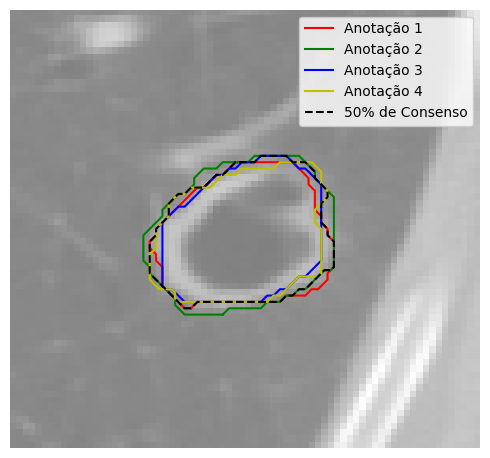

Nódulo 2
          
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Round                    | 5 
Margin             | Sharp                    | 5 
Lobulation         | Near Marked Lobulation   | 4 
Spiculation        | No Spiculation           | 1 
Texture            | Solid                    | 5 
Malignancy         | Indeterminate            | 3 
None
                                   
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid                    | 3 
Margin             | Near Poorly Defined      | 2 
Lobulation         | 

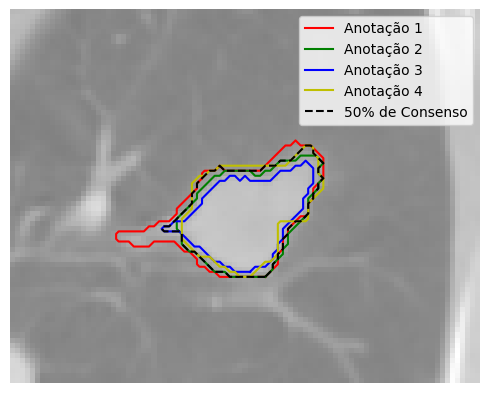

Nódulo 3
          
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Fairly Subtle            | 3 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid/Round              | 4 
Margin             | Medium Margin            | 3 
Lobulation         | No Lobulation            | 1 
Spiculation        | No Spiculation           | 1 
Texture            | Solid                    | 5 
Malignancy         | Moderately Unlikely      | 2 
None
                                   
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Obvious                  | 5 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid                    | 3 
Margin             | Near Poorly Defined      | 2 
Lobulation         | 

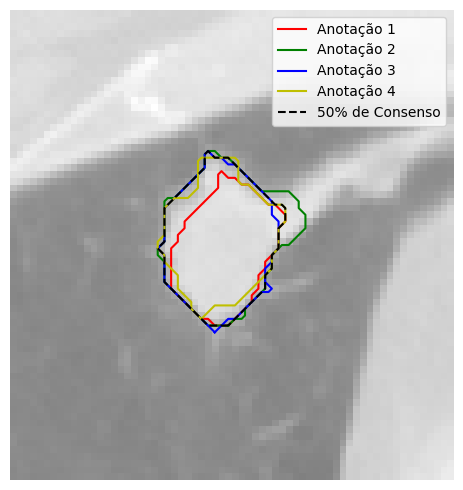

Nódulo 4
          
Feature              Meaning                    # 
-                    -                          - 
Subtlety           | Extremely Subtle         | 1 
Internalstructure  | Soft Tissue              | 1 
Calcification      | Absent                   | 6 
Sphericity         | Ovoid/Round              | 4 
Margin             | Near Poorly Defined      | 2 
Lobulation         | No Lobulation            | 1 
Spiculation        | No Spiculation           | 1 
Texture            | Non-Solid/GGO            | 1 
Malignancy         | Moderately Unlikely      | 2 
None
                                   


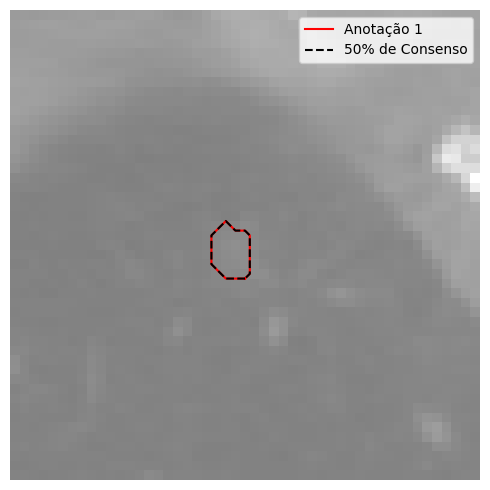

In [6]:
import numpy as np
import matplotlib.animation as manim
from skimage.measure import find_contours
from pylidc.utils import consensus

#CT do paciente com o id LIDC-IDRI-0068
scan = pyl.query(pyl.Scan).filter(pyl.Scan.patient_id == pid).first()

#Converte o scan num array NumPy para processamento da imagem
vol = scan.to_volume()

# Clusteriza as anotações para um nódulo específico
nods = scan.cluster_annotations()
for i in range (len(nods)):
    print('Nódulo',i+1)
    print('          ')
    anns = nods[i]  # Seleciona as anotações para o primeiro nódulo

    # Calcula o consenso das anotações com um nível de consenso de 50% e padding
    cmask, cbbox, masks = consensus(anns, clevel=0.5, pad=[(20, 20), (20, 20), (0, 0)])

    # Seleciona a fatia do meio (slice) no eixo z
    k = int(0.5 * (cbbox[2].stop - cbbox[2].start))

    # Cria uma figura e um eixo para plotagem
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))

    # Mostra a fatia do volume de TC com um mapa de cores em tons de cinza
    ax.imshow(vol[cbbox][:, :, k], cmap=plt.cm.gray, alpha=0.5)

    # Cores para as diferentes anotações
    colors = ['r', 'g', 'b', 'y']
    for ann in anns:
        print(ann.print_formatted_feature_table())
        print('                                   ')

    # Plota os contornos das anotações originais para a kº slice
    for j in range(len(masks)):
        for c in find_contours(masks[j][:, :, k].astype(float), 0.5):
            label = "Anotação %d" % (j+1)
            plt.plot(c[:, 1], c[:, 0], colors[j], label=label)

    # Plota o contorno do consenso de 50%
    for c in find_contours(cmask[:, :, k].astype(float), 0.5):
        plt.plot(c[:, 1], c[:, 0], '--k', label='50% de Consenso')

    # Configurações adicionais para a plotagem
    ax.axis('off')
    ax.legend()
    plt.tight_layout()
    plt.show()

Generalização para o resto do dataset, calculando valores médios dentro das anotações em cada nódulo para cada uma das features

In [7]:
#Nódulos com valores de calcificação diferentes
nod_id=-1
calcificacao_diferente=[]
for scan in pyl.query(pyl.Scan):
    
    nods = scan.cluster_annotations()
    if nods:
        for nod in nods:
            nod_id+=1
            a = nod[0].calcification
            for anns in nod:
                if anns.calcification != a:
                    calcificacao_diferente.append(nod_id)
                    break

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some n

In [8]:
print(calcificacao_diferente)
print(len(calcificacao_diferente))

[3, 7, 26, 38, 60, 64, 90, 98, 104, 125, 132, 133, 134, 135, 158, 166, 177, 246, 274, 290, 299, 300, 301, 302, 305, 347, 352, 353, 354, 402, 433, 434, 438, 440, 442, 443, 445, 462, 465, 482, 485, 509, 543, 555, 558, 561, 597, 603, 611, 633, 634, 640, 649, 652, 655, 658, 672, 692, 693, 694, 696, 698, 708, 711, 722, 723, 724, 732, 740, 744, 751, 753, 767, 784, 785, 815, 829, 835, 890, 924, 928, 930, 933, 940, 1002, 1055, 1071, 1076, 1087, 1103, 1106, 1114, 1116, 1123, 1128, 1143, 1145, 1146, 1160, 1161, 1183, 1190, 1196, 1197, 1199, 1219, 1228, 1235, 1244, 1262, 1263, 1276, 1287, 1291, 1298, 1321, 1325, 1326, 1327, 1383, 1390, 1391, 1394, 1415, 1429, 1482, 1483, 1502, 1503, 1504, 1507, 1511, 1513, 1515, 1538, 1574, 1576, 1578, 1580, 1599, 1606, 1620, 1667, 1716, 1736, 1746, 1761, 1762, 1777, 1780, 1808, 1818, 1820, 1835, 1865, 1876, 1879, 1897, 1901, 1908, 1927, 1948, 1949, 1950, 1951, 1970, 1977, 1982, 1995, 1996, 2013, 2015, 2017, 2032, 2034, 2037, 2065, 2066, 2086, 2095, 2100, 2101, 2

In [9]:
#Nódulos com valores de estrutura interna diferentes
nod_id=-1
estrutura_diferente=[]
for scan in pyl.query(pyl.Scan):
    
    nods = scan.cluster_annotations()
    if nods:
        for nod in nods:
            nod_id+=1
            a = nod[0].internalStructure
            for anns in nod:
                if anns.internalStructure != a:
                    estrutura_diferente.append(nod_id)
                    break

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some n

In [10]:
print(estrutura_diferente)
print(len(estrutura_diferente))

[103, 228, 236, 298, 355, 356, 357, 408, 411, 552, 621, 791, 969, 976, 1282, 1420, 1444, 1543, 1544, 1673, 1764, 1851, 1900, 2024, 2305, 2343, 2530]
27


In [11]:
nodulos_remover = estrutura_diferente + calcificacao_diferente
nodulos_remover = list(set(nodulos_remover))
print(nodulos_remover)
print(len(nodulos_remover))

[1538, 3, 1543, 1544, 7, 2065, 2066, 26, 2590, 543, 1055, 38, 1574, 552, 1576, 1578, 555, 1580, 2086, 558, 1071, 2095, 561, 2601, 2607, 1076, 2100, 2101, 2608, 2611, 2615, 2617, 60, 1087, 64, 1599, 1606, 2121, 1103, 2639, 1106, 1620, 597, 2644, 90, 603, 1114, 1116, 2140, 2650, 98, 611, 1123, 2149, 2150, 103, 104, 1128, 621, 2159, 2160, 1143, 633, 634, 1145, 1146, 125, 640, 1667, 132, 133, 134, 135, 1160, 1673, 649, 1161, 652, 2181, 655, 658, 2205, 158, 1183, 672, 2206, 2207, 166, 1190, 1196, 1197, 1199, 177, 692, 693, 694, 1716, 696, 2228, 698, 2234, 2236, 1219, 708, 2243, 711, 1736, 1228, 2254, 722, 723, 724, 1235, 1746, 732, 1244, 1761, 1762, 228, 1764, 740, 744, 236, 1262, 751, 1263, 753, 1777, 1780, 246, 2298, 1276, 2301, 767, 2305, 1282, 1287, 1291, 2319, 784, 785, 274, 1298, 1808, 791, 1818, 1820, 2334, 290, 2343, 1321, 298, 299, 300, 301, 302, 815, 1325, 305, 1326, 1327, 1835, 1851, 829, 835, 1865, 1876, 1879, 347, 352, 353, 354, 355, 356, 357, 1383, 1897, 2411, 1900, 1901, 1390

In [13]:
#para percorrer todos os pacientes no banco de dados PyLIDC

subtlety=[]
internalStructure=[]
calcification=[]
sphericity=[]
margin=[]
lobulation=[]
spiculation=[]
texture=[]
malignancy=[]
nodulo_id=[]

nod_id=-1

for scan in pyl.query(pyl.Scan):
    
    nods = scan.cluster_annotations()
    
    if nods:
        for nod in nods:
            nod_id+=1
            
            anns_subtlety=0
            anns_Structure=0
            anns_calcification=0
            anns_sphericity=0
            anns_margin=0
            anns_lobulation=0
            anns_spiculation=0
            anns_texture=0
            anns_malignancy=0
            
            for anns in nod:
                anns_subtlety+=anns.subtlety
                anns_Structure+=anns.internalStructure
                anns_calcification+=anns.calcification
                anns_sphericity+=anns.sphericity
                anns_margin+=anns.margin
                anns_lobulation+=anns.lobulation
                anns_spiculation+=anns.spiculation
                anns_texture+=anns.texture
                anns_malignancy+=anns.malignancy
            
            
            num_ann=len(nod) 
            subtlety.append(anns_subtlety/num_ann)
            internalStructure.append(anns_Structure/num_ann)
            calcification.append(anns_calcification/num_ann)
            sphericity.append(anns_sphericity/num_ann)
            margin.append(anns_margin/num_ann)
            lobulation.append(anns_lobulation/num_ann)
            spiculation.append(anns_spiculation/num_ann)
            texture.append(anns_texture/num_ann)
            malignancy.append(anns_malignancy/num_ann)
            nodulo_id.append(nod_id)
        
    else:
        pass
        

        
#criar o DataFrame
data={'Nodulo_id':nodulo_id,'Sutlety':subtlety,'Internal_Structure':internalStructure,'Calcification':calcification,'Sphericity':sphericity,'Margin':margin,'Lobulation':lobulation,'Spiculation':spiculation,'Texture':texture,'Malignancy':malignancy}
df=pd.DataFrame(data)
            
            
        
        
        
        
    

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.
Failed to reduce all groups to <= 4 Annotations.
Some n

In [6]:
df

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.25,4.750000,3.75
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.25,4.500000,3.75
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.00,5.000000,1.00
3,3,5.000000,1.0,5.0,3.750000,3.250000,3.250000,2.75,4.750000,4.25
4,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.00,4.750000,3.25
...,...,...,...,...,...,...,...,...,...,...
2646,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.00,3.333333,4.00
2647,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.50,1.000000,3.50
2648,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.00,5.000000,3.50
2649,2649,5.000000,1.0,6.0,4.000000,5.000000,1.000000,1.00,5.000000,2.00


In [14]:
df = df.loc[~df['Nodulo_id'].isin(nodulos_remover)]
df

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.250000,4.750000,3.750000
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.250000,4.500000,3.750000
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.000000,5.000000,1.000000
4,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.000000,4.750000,3.250000
5,5,2.000000,1.0,6.0,4.000000,4.000000,5.000000,5.000000,5.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...
2645,2645,3.333333,1.0,6.0,3.666667,3.000000,1.000000,1.666667,2.333333,3.333333
2646,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.000000,3.333333,4.000000
2647,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.500000,1.000000,3.500000
2648,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.000000,5.000000,3.500000


##### Criação da Target

In [15]:
conditions = [
    (df['Malignancy'] >= 3.5),
    (df['Malignancy'] < 2.5),
    (df['Malignancy'] >= 2.5) & (df['Malignancy'] < 3.5)
]

choices = ['Yes', 'No', 'Indeterminate']

df['Target'] = np.select(conditions, choices, default='')
df['Target'], _ = pd.factorize(df['Target'])
df2=df.copy()
df

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy,Target
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.250000,4.750000,3.750000,0
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.250000,4.500000,3.750000,0
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.000000,5.000000,1.000000,1
4,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.000000,4.750000,3.250000,2
5,5,2.000000,1.0,6.0,4.000000,4.000000,5.000000,5.000000,5.000000,2.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
2645,2645,3.333333,1.0,6.0,3.666667,3.000000,1.000000,1.666667,2.333333,3.333333,2
2646,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.000000,3.333333,4.000000,0
2647,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.500000,1.000000,3.500000,0
2648,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.000000,5.000000,3.500000,0


##### Matriz de correlação

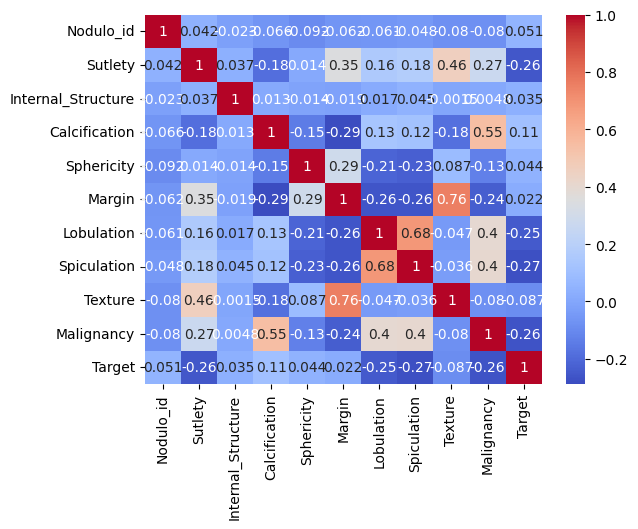

In [16]:
correlation_matrix = df2.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

### Extração das features PyRadiomics

In [17]:
import pylidc as pl
# configura o extrator de características do PyRadiomics sem o arquivo params.yaml
extractor = featureextractor.RadiomicsFeatureExtractor()

scans_with_annotations = pl.query(pl.Scan).filter(pl.Scan.annotations.any()).all()

# lista para armazenar as características
features_list = []
patient_ids = []

# variável para criar ids dos nódulos
nodule_id_counter = 0

for scan in scans_with_annotations:
    patient_id = scan.patient_id
   
    # separacao de nodulos
    nods = scan.cluster_annotations()
    for anns in nods:
        # Realize a consolidação de consenso e nível de acordo de 50%
        cmask, cbbox, masks = consensus(anns, clevel=0.5, pad=[(20, 20), (20, 20), (0, 0)])
       
        # converter a matriz de pixels para uma imagem
        image = sitk.GetImageFromArray(cmask.astype(float))
       
        # extrair características usando pyradiomics
        features = extractor.execute(image, image, label=1) 
        patient_ids.append(patient_id)
        features['Nodulo_id'] = nodule_id_counter
        nodule_id_counter += 1
       
        features_list.append(features)

features_df = pd.DataFrame(features_list)


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

Failed to reduce all groups to <= 4 Annotations.
Some nodules may be close and must be grouped manually.


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated
GLCM is symmetrical, therefore Sum Average = 2 * Joint Avera

In [97]:
features_df

,diagnostics_Versions_PyRadiomics,diagnostics_Versions_Numpy,diagnostics_Versions_SimpleITK,diagnostics_Versions_PyWavelet,diagnostics_Versions_Python,diagnostics_Configuration_Settings,diagnostics_Configuration_EnabledImageTypes,diagnostics_Image-original_Hash,diagnostics_Image-original_Dimensionality,diagnostics_Image-original_Spacing,...,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,Nodulo_id
0,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},966db6c8d814983bbfe7125907b2ae5008c7994e,3D,"(1.0, 1.0, 1.0)",...,0,0,0,0,0,0,0,0,0,0
1,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},d750f93365c734f6f1972e806b046bb1a203f47f,3D,"(1.0, 1.0, 1.0)",...,1,0,1,0,0,0,0,0,0,1
2,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},58d9ee5073ad7215556c1e295a67e9204a623b2d,3D,"(1.0, 1.0, 1.0)",...,2,0,2,0,0,0,0,0,0,2
3,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},312913e3e22bc6f2e6cffc8abd1120da5fa413fd,3D,"(1.0, 1.0, 1.0)",...,3,1,3,1,0,0,0,0,0,3
4,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},08706c40effcb9f7489dc9ce0139a265b8dc6048,3D,"(1.0, 1.0, 1.0)",...,4,0,4,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2646,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},db18dcbfdf1ebd1c1390db9dd1fbfd85cce4724b,3D,"(1.0, 1.0, 1.0)",...,959,0,948,0,0,0,0,0,0,2646
2647,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},fe63df501e056c7f875ab771151194481c70a0b1,3D,"(1.0, 1.0, 1.0)",...,960,0,949,0,0,0,0,0,0,2647
2648,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},e25d0da08cbc45ea3587c9426cc102940176a4de,3D,"(1.0, 1.0, 1.0)",...,724,0,719,0,0,0,0,0,0,2648
2649,v3.1.0,1.23.5,2.3.0,1.3.0,3.9.13,"{'minimumROIDimensions': 2, 'minimumROISize': ...",{'Original': {}},5888efc13966913742433819826d00f4d79f0c24,3D,"(1.0, 1.0, 1.0)",...,108,0,108,0,0,0,0,0,0,2649


In [98]:
df_pca=pd.merge(df2, features_df, on='Nodulo_id')

In [99]:
features_df.columns

Index(['diagnostics_Versions_PyRadiomics', 'diagnostics_Versions_Numpy',
       'diagnostics_Versions_SimpleITK', 'diagnostics_Versions_PyWavelet',
       'diagnostics_Versions_Python', 'diagnostics_Configuration_Settings',
       'diagnostics_Configuration_EnabledImageTypes',
       'diagnostics_Image-original_Hash',
       'diagnostics_Image-original_Dimensionality',
       'diagnostics_Image-original_Spacing',
       ...
       'original_glszm_SmallAreaLowGrayLevelEmphasis',
       'original_glszm_ZoneEntropy', 'original_glszm_ZonePercentage',
       'original_glszm_ZoneVariance', 'original_ngtdm_Busyness',
       'original_ngtdm_Coarseness', 'original_ngtdm_Complexity',
       'original_ngtdm_Contrast', 'original_ngtdm_Strength', 'Nodulo_id'],
      dtype='object', length=130)

In [100]:
# Quantas sao numericas
num_colunas_numericas = len(features_df.select_dtypes(include=['number']).columns)

print(f"O DataFrame possui {num_colunas_numericas} colunas numéricas")

O DataFrame possui 113 colunas numéricas


In [101]:
# Quantas sao nao numericas
num_colunas_non_numericas = len(features_df.select_dtypes(exclude=['number']).columns)

print(f"O DataFrame possui {num_colunas_non_numericas} colunas não numéricas")

O DataFrame possui 17 colunas não numéricas


In [102]:
features_df.describe()

,diagnostics_Image-original_Mean,diagnostics_Image-original_Minimum,diagnostics_Image-original_Maximum,diagnostics_Mask-original_VoxelNum,diagnostics_Mask-original_VolumeNum,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,...,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,Nodulo_id
count,2651.000000,2651.0,2651.0,2651.000000,2651.000000,2651.000000,2651.000000,2651.000000,2651.000000,2651.000000,...,2651.000000,2651.000000,2651.000000,2651.00000,2651.0,2651.0,2651.0,2651.0,2651.0,2651.000000
mean,0.018546,0.0,1.0,767.754055,1.030177,0.758962,0.375975,4.365222,12.369813,68.370803,...,311.898529,0.043757,308.538665,0.42550,0.0,0.0,0.0,0.0,0.0,1325.000000
std,0.015681,0.0,0.0,2146.458892,0.373452,0.130097,0.179068,3.315755,8.295844,69.219161,...,255.853288,0.373118,252.398347,3.64666,0.0,0.0,0.0,0.0,0.0,765.422106
min,0.000842,0.0,1.0,5.000000,1.000000,0.259786,0.000000,0.000000,2.529822,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000
25%,0.008952,0.0,1.0,74.000000,1.000000,0.679440,0.247986,2.374696,7.246937,20.000000,...,98.000000,0.000000,98.000000,0.00000,0.0,0.0,0.0,0.0,0.0,662.500000
50%,0.013310,0.0,1.0,148.000000,1.000000,0.777843,0.346953,3.541325,9.570036,42.000000,...,242.000000,0.000000,241.000000,0.00000,0.0,0.0,0.0,0.0,0.0,1325.000000
75%,0.022074,0.0,1.0,417.500000,1.000000,0.858373,0.497471,5.174388,13.904928,85.000000,...,476.500000,0.000000,468.500000,0.00000,0.0,0.0,0.0,0.0,0.0,1987.500000
max,0.126805,0.0,1.0,45329.000000,17.000000,0.995478,0.909017,35.444088,65.112626,324.000000,...,961.000000,8.000000,950.000000,47.00000,0.0,0.0,0.0,0.0,0.0,2650.000000


In [103]:
df_pca

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.250000,4.750000,3.750000,...,0,0,0,0,0,0,0,0,0,0
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.250000,4.500000,3.750000,...,1,1,0,1,0,0,0,0,0,0
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.000000,5.000000,1.000000,...,2,2,0,2,0,0,0,0,0,0
3,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.000000,4.750000,3.250000,...,4,4,0,4,0,0,0,0,0,0
4,5,2.000000,1.0,6.0,4.000000,4.000000,5.000000,5.000000,5.000000,2.000000,...,5,5,0,5,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,2645,3.333333,1.0,6.0,3.666667,3.000000,1.000000,1.666667,2.333333,3.333333,...,39,39,0,39,0,0,0,0,0,0
2405,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.000000,3.333333,4.000000,...,959,959,0,948,0,0,0,0,0,0
2406,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.500000,1.000000,3.500000,...,960,960,0,949,0,0,0,0,0,0
2407,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.000000,5.000000,3.500000,...,724,724,0,719,0,0,0,0,0,0


##### Transformação de algumas colunas type object a numéricas

In [104]:
colunas_object = []

for coluna in features_df.columns:
    if features_df[coluna].dtype == 'object':
        colunas_object.append(coluna)

colunas_ndarray=[]
for coluna in colunas_object:
    if isinstance(features_df[coluna].iloc[0], np.ndarray):
        #  o primeiro valor é um numpy.ndarray
        colunas_ndarray.append(coluna)
        

# Iterar sobre as colunas com numpy.ndarray e aplicar a conversão e factorização
for coluna in colunas_ndarray:
    features_df[coluna] = features_df[coluna].apply(lambda arr: str(arr))
    features_df[coluna], _ = pd.factorize(features_df[coluna])

#### Junção das features do Pylidc com PyRadiomics

In [105]:
df['Nodulo_id']=df['Nodulo_id'].astype(int)

df = pd.merge(df, features_df, on='Nodulo_id')
df

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.250000,4.750000,3.750000,...,0,0,0,0,0,0,0,0,0,0
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.250000,4.500000,3.750000,...,1,1,0,1,0,0,0,0,0,0
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.000000,5.000000,1.000000,...,2,2,0,2,0,0,0,0,0,0
3,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.000000,4.750000,3.250000,...,4,4,0,4,0,0,0,0,0,0
4,5,2.000000,1.0,6.0,4.000000,4.000000,5.000000,5.000000,5.000000,2.000000,...,5,5,0,5,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,2645,3.333333,1.0,6.0,3.666667,3.000000,1.000000,1.666667,2.333333,3.333333,...,39,39,0,39,0,0,0,0,0,0
2405,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.000000,3.333333,4.000000,...,959,959,0,948,0,0,0,0,0,0
2406,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.500000,1.000000,3.500000,...,960,960,0,949,0,0,0,0,0,0
2407,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.000000,5.000000,3.500000,...,724,724,0,719,0,0,0,0,0,0


In [106]:
# Quantas sao numericas
num_colunas_numericas = len(df.select_dtypes(include=['number']).columns)

print(f"O DataFrame possui {num_colunas_numericas} colunas numéricas")

O DataFrame possui 347 colunas numéricas


In [107]:
colunas_nao_numericas = df.select_dtypes(exclude=['number']).columns
print(colunas_nao_numericas)

Index(['diagnostics_Versions_PyRadiomics', 'diagnostics_Versions_Numpy',
       'diagnostics_Versions_SimpleITK', 'diagnostics_Versions_PyWavelet',
       'diagnostics_Versions_Python', 'diagnostics_Configuration_Settings',
       'diagnostics_Configuration_EnabledImageTypes',
       'diagnostics_Image-original_Hash',
       'diagnostics_Image-original_Dimensionality',
       'diagnostics_Image-original_Spacing', 'diagnostics_Image-original_Size',
       'diagnostics_Mask-original_Hash', 'diagnostics_Mask-original_Spacing',
       'diagnostics_Mask-original_Size',
       'diagnostics_Mask-original_BoundingBox',
       'diagnostics_Mask-original_CenterOfMassIndex',
       'diagnostics_Mask-original_CenterOfMass'],
      dtype='object')


In [108]:
df = df.drop(columns=colunas_nao_numericas)
df

,Nodulo_id,Sutlety,Internal_Structure,Calcification,Sphericity,Margin,Lobulation,Spiculation,Texture,Malignancy,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,0,4.500000,1.0,6.0,4.000000,3.250000,2.250000,2.250000,4.750000,3.750000,...,0,0,0,0,0,0,0,0,0,0
1,1,4.750000,1.0,6.0,4.000000,2.750000,3.000000,2.250000,4.500000,3.750000,...,1,1,0,1,0,0,0,0,0,0
2,2,4.000000,1.0,5.0,5.000000,5.000000,1.000000,1.000000,5.000000,1.000000,...,2,2,0,2,0,0,0,0,0,0
3,4,2.500000,1.0,6.0,4.500000,4.250000,4.000000,4.000000,4.750000,3.250000,...,4,4,0,4,0,0,0,0,0,0
4,5,2.000000,1.0,6.0,4.000000,4.000000,5.000000,5.000000,5.000000,2.000000,...,5,5,0,5,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,2645,3.333333,1.0,6.0,3.666667,3.000000,1.000000,1.666667,2.333333,3.333333,...,39,39,0,39,0,0,0,0,0,0
2405,2646,4.333333,1.0,6.0,3.666667,2.333333,2.333333,3.000000,3.333333,4.000000,...,959,959,0,948,0,0,0,0,0,0
2406,2647,2.500000,1.0,6.0,4.500000,2.000000,1.000000,1.500000,1.000000,3.500000,...,960,960,0,949,0,0,0,0,0,0
2407,2648,3.000000,1.0,6.0,3.500000,3.500000,1.500000,1.000000,5.000000,3.500000,...,724,724,0,719,0,0,0,0,0,0


### Sem aplicar nenhum método para extração das melhores features

#### Naive Bayes

Accuracy: 56.64%
              precision    recall  f1-score   support

           0       0.64      0.60      0.62        95
           1       0.48      0.63      0.55       145
           2       0.61      0.51      0.56       242

    accuracy                           0.57       482
   macro avg       0.58      0.58      0.58       482
weighted avg       0.58      0.57      0.57       482



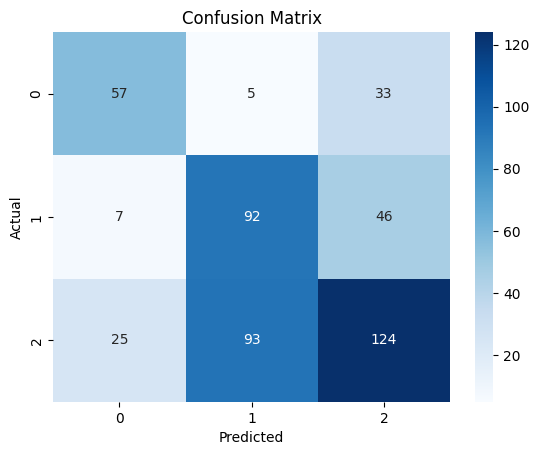

In [109]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

naive_bayes_model = GaussianNB()

naive_bayes_model.fit(X_train, y_train)

y_pred = naive_bayes_model.predict(X_test)

accuracy_naivebayes = accuracy_score(y_test, y_pred)
precision_naivebayes = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_naivebayes * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Ensemble Stacking

Accuracy: 57.05%
              precision    recall  f1-score   support

           0       0.60      0.76      0.67        95
           1       0.49      0.74      0.59       145
           2       0.68      0.39      0.50       242

    accuracy                           0.57       482
   macro avg       0.59      0.63      0.59       482
weighted avg       0.61      0.57      0.56       482



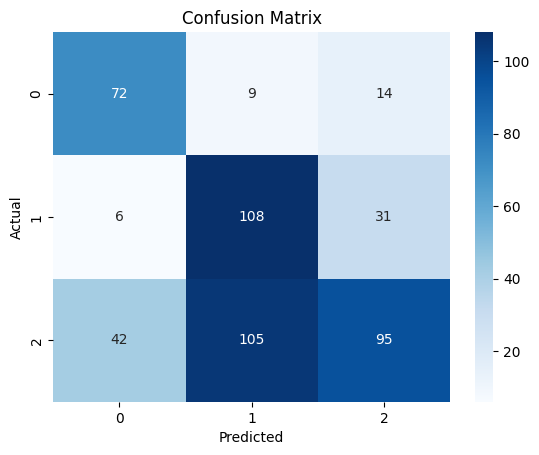

In [110]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

base_model1 = GaussianNB()
base_model2 = DecisionTreeClassifier(random_state=42)

meta_model = GaussianNB()

stacking_model = StackingClassifier(
    estimators=[('nb', base_model1), ('dt', base_model2)],
    final_estimator=meta_model
)

stacking_model.fit(X_train, y_train)

y_pred = stacking_model.predict(X_test)
accuracy_ensemblestacking = accuracy_score(y_test, y_pred)
precision_ensemblestacking = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_ensemblestacking * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Decision Tree

Accuracy: 64.32%
              precision    recall  f1-score   support

           0       0.65      0.66      0.66        95
           1       0.60      0.59      0.59       145
           2       0.66      0.67      0.67       242

    accuracy                           0.64       482
   macro avg       0.64      0.64      0.64       482
weighted avg       0.64      0.64      0.64       482



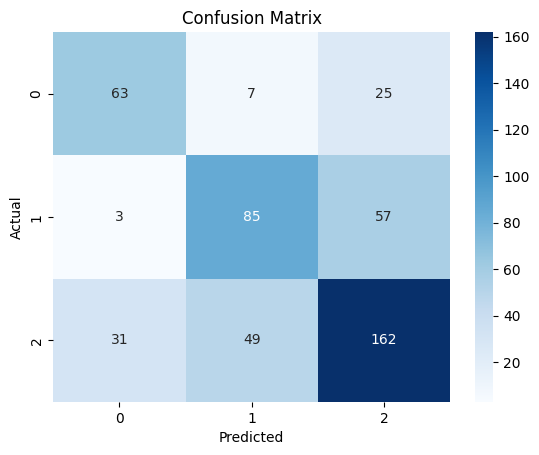

In [111]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
decision_tree_model = DecisionTreeClassifier(random_state=42)

decision_tree_model.fit(X_train, y_train)
y_pred = decision_tree_model.predict(X_test)

accuracy_decisiontree = accuracy_score(y_test, y_pred)
precision_decisiontree = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_decisiontree * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Logistic Regression

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 55.39%
              precision    recall  f1-score   support

           0       0.50      0.57      0.53        95
           1       0.65      0.09      0.16       145
           2       0.56      0.83      0.67       242

    accuracy                           0.55       482
   macro avg       0.57      0.49      0.45       482
weighted avg       0.58      0.55      0.49       482



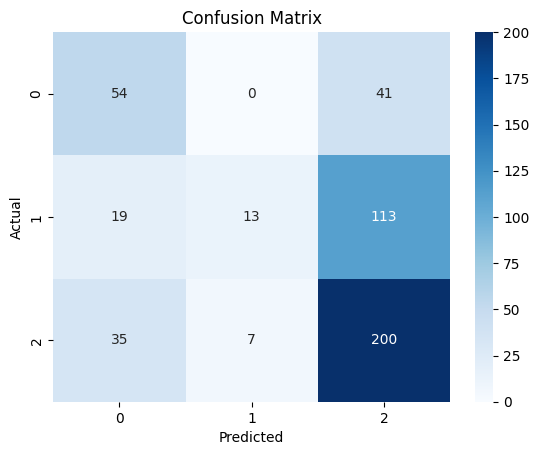

In [118]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
logistic_model = LogisticRegression()

logistic_model.fit(X_train, y_train)
y_pred = logistic_model.predict(X_test)

accuracy_logisticregression = accuracy_score(y_test, y_pred)
precision_logisticregression = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_logisticregression * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### SVM

Accuracy: 66.18%
              precision    recall  f1-score   support

           0       0.78      0.64      0.70       103
           1       0.72      0.38      0.50       148
           2       0.62      0.85      0.72       231

    accuracy                           0.66       482
   macro avg       0.70      0.62      0.64       482
weighted avg       0.68      0.66      0.65       482



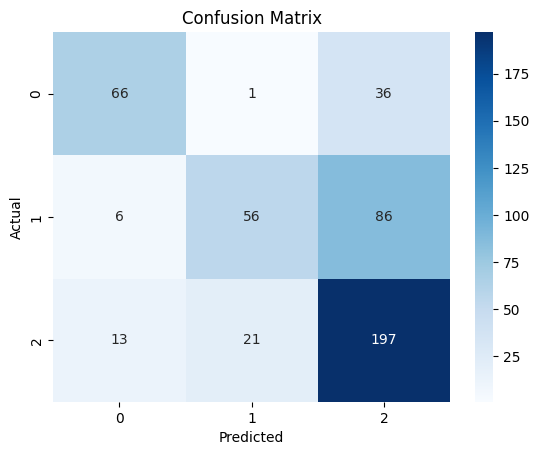

In [113]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)

clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy_svm = accuracy_score(y_test, y_pred)
precision_svm = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_svm * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Accuracy

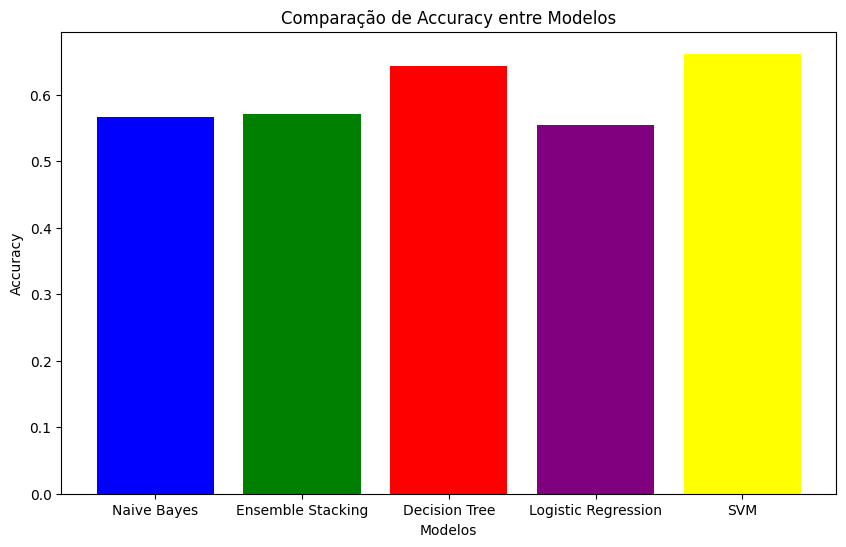

In [116]:

model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
accuracies = [accuracy_naivebayes, accuracy_ensemblestacking, accuracy_decisiontree, accuracy_logisticregression, accuracy_svm]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple','yellow'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()


#### Precisão

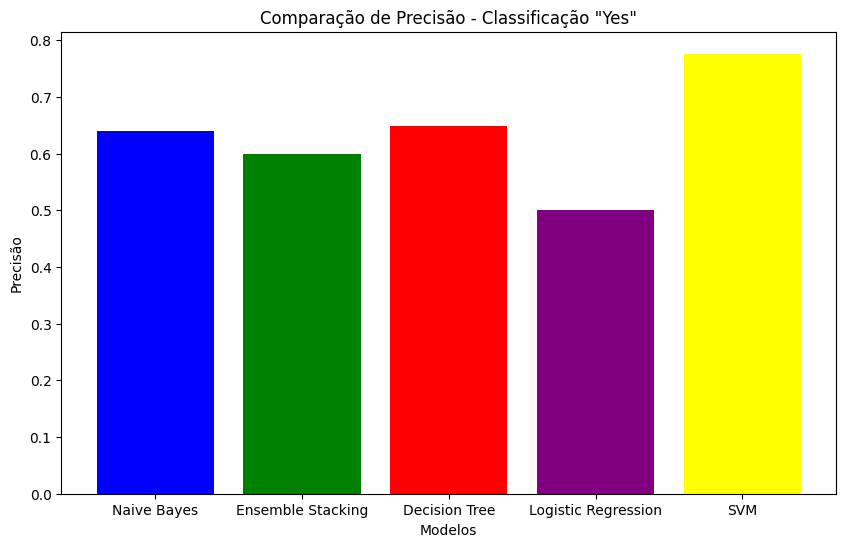

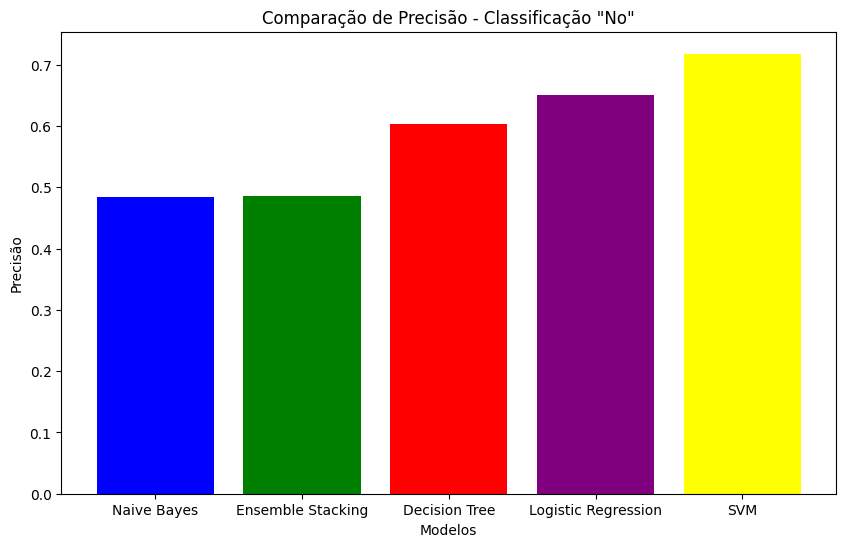

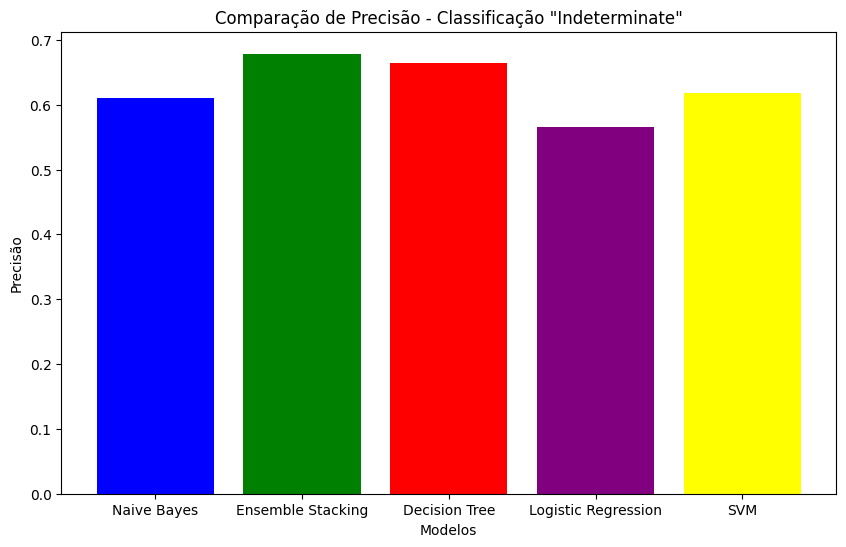

In [119]:
model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
precisions_0 = [precision_naivebayes[0], precision_ensemblestacking[0],\
              precision_decisiontree[0], precision_logisticregression[0], precision_svm[0]]
precisions_1 = [precision_naivebayes[1], precision_ensemblestacking[1],\
              precision_decisiontree[1], precision_logisticregression[1], precision_svm[1]]
precisions_2 = [precision_naivebayes[2], precision_ensemblestacking[2],\
              precision_decisiontree[2], precision_logisticregression[2], precision_svm[2]]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

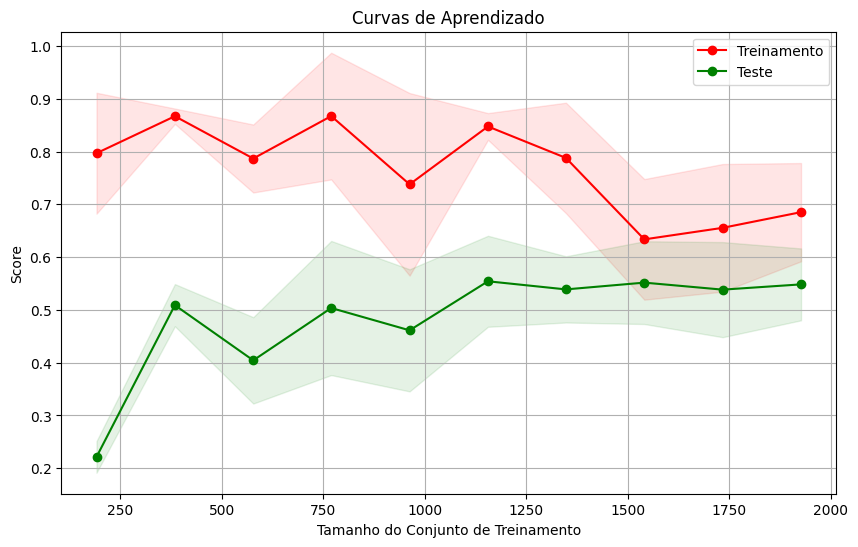

In [120]:
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt


train_sizes, train_scores, test_scores = learning_curve(stacking_model, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10))
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.title("Curvas de Aprendizado")
plt.xlabel("Tamanho do Conjunto de Treinamento")
plt.ylabel("Score")
plt.grid()
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Treinamento")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Teste")
plt.legend(loc="best")
plt.show()


## Escolha de Features

### Random Forest

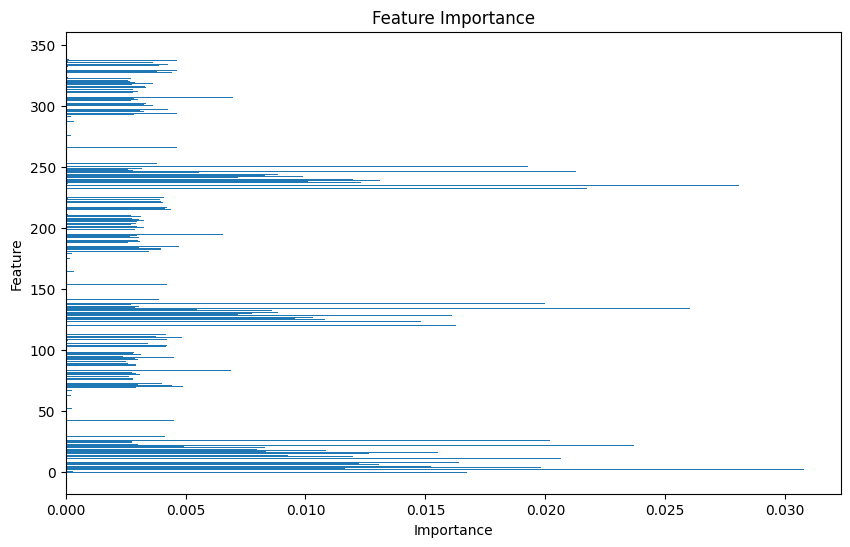

In [121]:
X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target'] 

imputer = SimpleImputer(strategy='mean')#o que é?
X = imputer.fit_transform(X)
#recuperar
column_names = X_original.select_dtypes(include=['number']).columns

X = pd.DataFrame(X)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# importancias das features
feature_importances = rf_model.feature_importances_

# dataset com as importancias e nomes das features
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# odenar as features pela importancia
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# grafico de barras das importancias das features
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

In [122]:
feature_importance_df['Feature'] = column_names[feature_importance_df['Feature']]

print(feature_importance_df)

                                Feature  Importance
2                         Calcification    0.030776
235  diagnostics_Mask-original_VoxelNum    0.028067
134    original_shape_MinorAxisLength_y    0.026042
22     original_shape_MinorAxisLength_x    0.023686
232     diagnostics_Image-original_Mean    0.021745
..                                  ...         ...
160     original_glcm_ClusterTendency_y    0.000000
161            original_glcm_Contrast_y    0.000000
162         original_glcm_Correlation_y    0.000000
163   original_glcm_DifferenceAverage_y    0.000000
343             original_ngtdm_Strength    0.000000

[344 rows x 2 columns]


In [123]:
feature_importance_df.to_csv('feature_importance.csv', index=False)
feature_importance = pd.read_csv('feature_importance.csv')
feature_importance

,Feature,Importance
0,Calcification,0.030776
1,diagnostics_Mask-original_VoxelNum,0.028067
2,original_shape_MinorAxisLength_y,0.026042
3,original_shape_MinorAxisLength_x,0.023686
4,diagnostics_Image-original_Mean,0.021745
...,...,...
339,original_glcm_ClusterTendency_y,0.000000
340,original_glcm_Contrast_y,0.000000
341,original_glcm_Correlation_y,0.000000
342,original_glcm_DifferenceAverage_y,0.000000


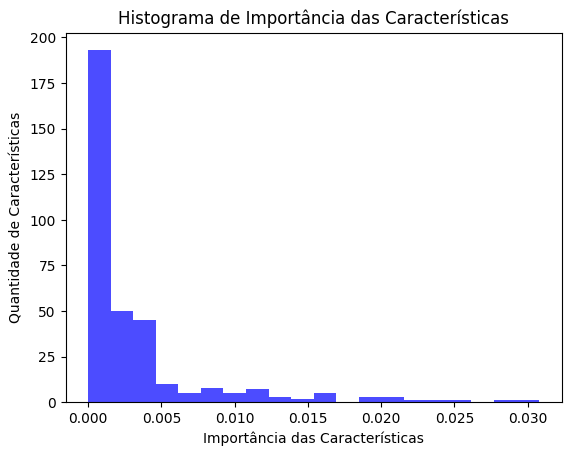

In [124]:
plt.hist(feature_importance["Importance"], bins=20, color='blue', alpha=0.7)
plt.xlabel("Importância das Características")
plt.ylabel("Quantidade de Características")
plt.title("Histograma de Importância das Características")
plt.show()


In [125]:
selected_features = feature_importance[feature_importance["Importance"] >= 0.015]

In [126]:
selected_features

,Feature,Importance
0,Calcification,0.030776
1,diagnostics_Mask-original_VoxelNum,0.028067
2,original_shape_MinorAxisLength_y,0.026042
3,original_shape_MinorAxisLength_x,0.023686
4,diagnostics_Image-original_Mean,0.021745
5,original_shape_MinorAxisLength,0.021287
6,diagnostics_Mask-original_VoxelNum_x,0.020657
7,original_shape_VoxelVolume_x,0.020192
8,original_shape_VoxelVolume_y,0.019994
9,Margin,0.019816


In [127]:
selected_columns = selected_features['Feature'].tolist()
df_selected = df[selected_columns]
df_selected

,Calcification,diagnostics_Mask-original_VoxelNum,original_shape_MinorAxisLength_y,original_shape_MinorAxisLength_x,diagnostics_Image-original_Mean,original_shape_MinorAxisLength,diagnostics_Mask-original_VoxelNum_x,original_shape_VoxelVolume_x,original_shape_VoxelVolume_y,Margin,original_shape_VoxelVolume,Sutlety,diagnostics_Image-original_Mean_x,diagnostics_Image-original_Mean_y,original_shape_MajorAxisLength_y,original_shape_MajorAxisLength_x,Lobulation
0,6.0,1903,21.474857,21.474857,0.051024,21.474857,1903,1903.0,1903.0,3.250000,1903.0,4.500000,0.051024,0.051024,25.306411,25.306411,2.250000
1,6.0,1741,20.477091,20.477091,0.054136,20.477091,1741,1741.0,1741.0,2.750000,1741.0,4.750000,0.054136,0.054136,24.222923,24.222923,3.000000
2,5.0,34,4.958806,4.958806,0.007535,4.958806,34,34.0,34.0,5.000000,34.0,4.000000,0.007535,0.007535,5.639429,5.639429,1.000000
3,6.0,521,9.653513,9.653513,0.014866,9.653513,521,521.0,521.0,4.250000,521.0,2.500000,0.014866,0.014866,12.378110,12.378110,4.000000
4,6.0,15,3.910430,3.910430,0.006938,3.910430,15,15.0,15.0,4.000000,15.0,2.000000,0.006938,0.006938,5.009955,5.009955,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2404,6.0,71,6.029670,6.029670,0.013654,6.029670,71,71.0,71.0,3.000000,71.0,3.333333,0.013654,0.013654,7.917188,7.917188,1.000000
2405,6.0,325,9.595771,9.595771,0.010188,9.595771,325,325.0,325.0,2.333333,325.0,4.333333,0.010188,0.010188,12.087678,12.087678,2.333333
2406,6.0,623,9.416961,9.416961,0.019069,9.416961,623,623.0,623.0,2.000000,623.0,2.500000,0.019069,0.019069,12.485120,12.485120,1.000000
2407,6.0,189,7.855304,7.855304,0.020854,7.855304,189,189.0,189.0,3.500000,189.0,3.000000,0.020854,0.020854,13.922612,13.922612,1.500000


#### Naive Bayes

Accuracy: 64.73%
              precision    recall  f1-score   support

           0       0.81      0.58      0.67       150
           1       0.66      0.43      0.52       220
           2       0.61      0.81      0.70       353

    accuracy                           0.65       723
   macro avg       0.69      0.61      0.63       723
weighted avg       0.66      0.65      0.64       723



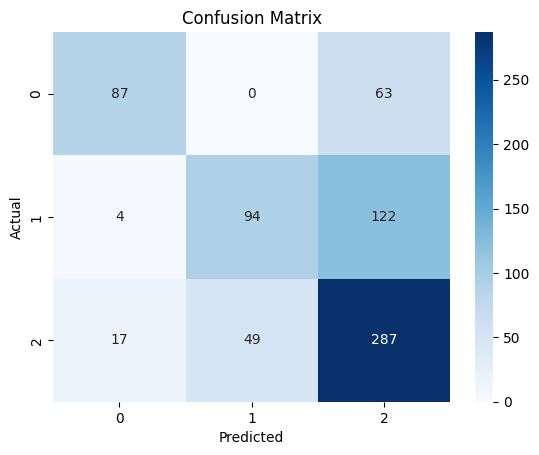

In [128]:

X = df_selected
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

naive_bayes_model = GaussianNB()

naive_bayes_model.fit(X_train, y_train)

y_pred = naive_bayes_model.predict(X_test)

accuracy_naivebayes_rf = accuracy_score(y_test, y_pred)
precision_naivebayes_rf = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_naivebayes_rf * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Ensemble Stacking

Accuracy: 61.27%
              precision    recall  f1-score   support

           0       0.74      0.66      0.70       152
           1       0.50      0.64      0.56       210
           2       0.65      0.57      0.61       361

    accuracy                           0.61       723
   macro avg       0.63      0.63      0.63       723
weighted avg       0.63      0.61      0.62       723



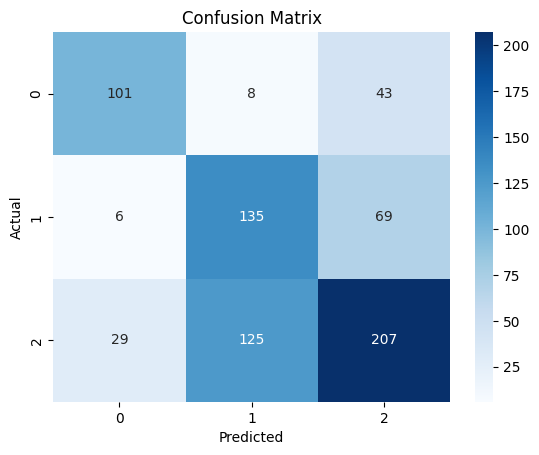

In [129]:

X = df_selected
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=20)

base_model1 = GaussianNB()
base_model2 = DecisionTreeClassifier(random_state=42)

meta_model = GaussianNB()

stacking_model = StackingClassifier(
    estimators=[('nb', base_model1), ('rf', base_model2)],
    final_estimator=meta_model
)

stacking_model.fit(X_train, y_train)

y_pred = stacking_model.predict(X_test)
accuracy_ensemblestacking_rf = accuracy_score(y_test, y_pred)
precision_ensemblestacking_rf = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_ensemblestacking_rf * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Decision Tree

Accuracy: 57.05%
              precision    recall  f1-score   support

           0       0.58      0.68      0.63        95
           1       0.51      0.50      0.50       145
           2       0.60      0.57      0.59       242

    accuracy                           0.57       482
   macro avg       0.56      0.58      0.57       482
weighted avg       0.57      0.57      0.57       482



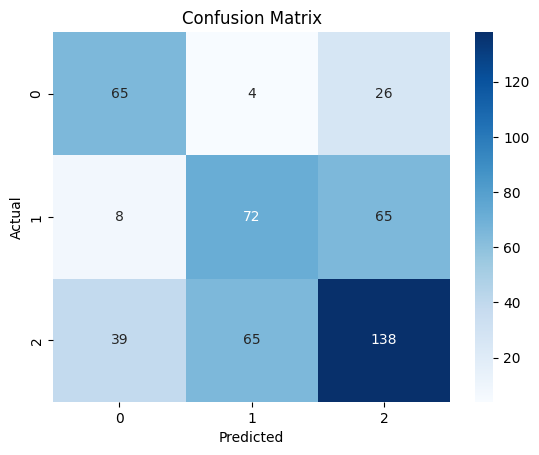

In [130]:
X = df_selected
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
decision_tree_model = DecisionTreeClassifier(random_state=42)

decision_tree_model.fit(X_train, y_train)
y_pred = decision_tree_model.predict(X_test)

accuracy_decisiontree_rf = accuracy_score(y_test, y_pred)
precision_decisiontree_rf = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_decisiontree_rf * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Logistic Regression

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 63.90%
              precision    recall  f1-score   support

           0       0.70      0.62      0.66        95
           1       0.77      0.23      0.36       145
           2       0.61      0.89      0.72       242

    accuracy                           0.64       482
   macro avg       0.69      0.58      0.58       482
weighted avg       0.68      0.64      0.60       482



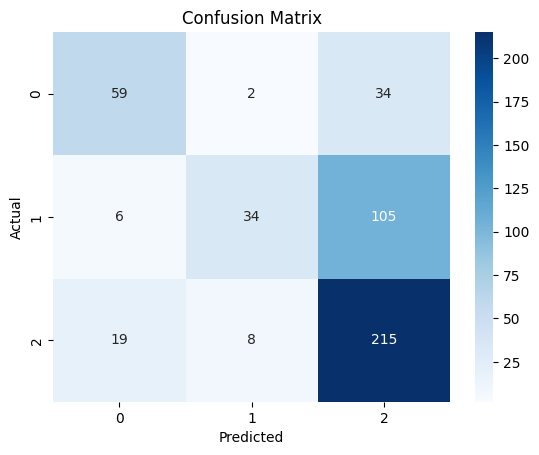

In [131]:
X = df_selected
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
logistic_model = LogisticRegression()

logistic_model.fit(X_train, y_train)
y_pred = logistic_model.predict(X_test)

accuracy_logisticregression_rf = accuracy_score(y_test, y_pred)
precision_logisticregression_rf = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_logisticregression_rf * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### SVM

Accuracy: 69.02%
              precision    recall  f1-score   support

           0       0.77      0.76      0.76       152
           1       0.71      0.42      0.53       210
           2       0.66      0.82      0.73       361

    accuracy                           0.69       723
   macro avg       0.71      0.67      0.67       723
weighted avg       0.70      0.69      0.68       723



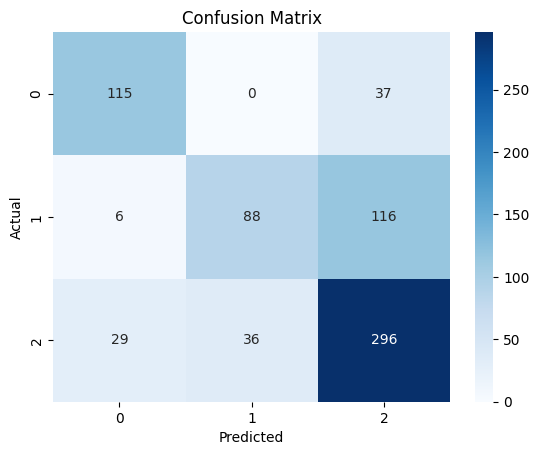

In [132]:
X = df_selected
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=20)
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

accuracy_svm_rf = accuracy_score(y_test, y_pred)
precision_svm_rf = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_svm_rf * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Accuracy

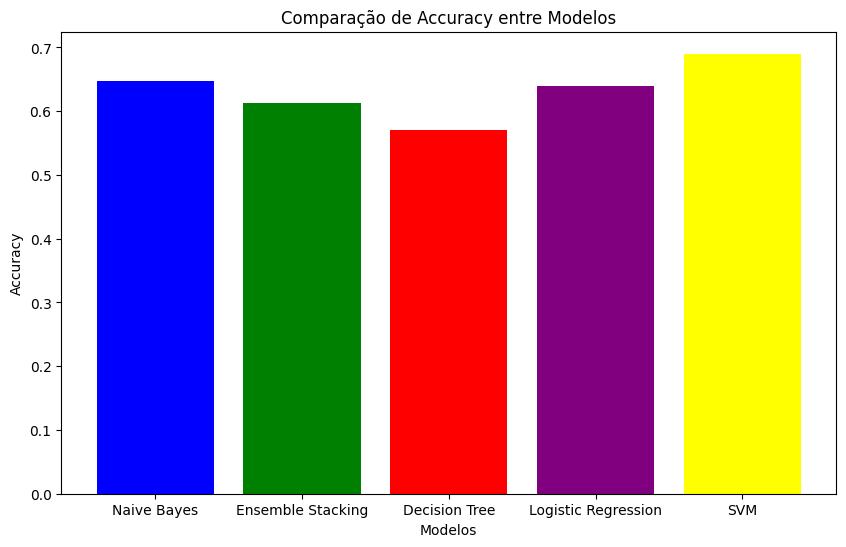

In [133]:
model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
accuracies = [accuracy_naivebayes_rf, accuracy_ensemblestacking_rf,\
              accuracy_decisiontree_rf, accuracy_logisticregression_rf, accuracy_svm_rf]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple','yellow'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

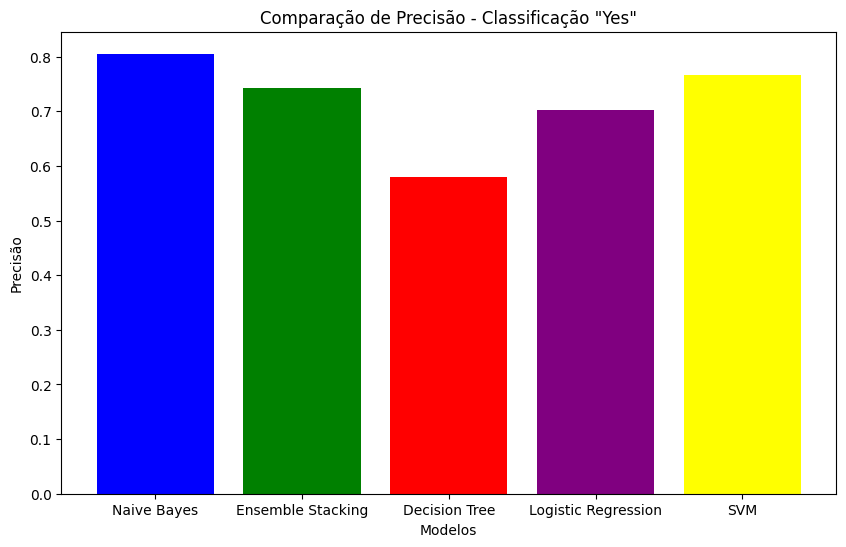

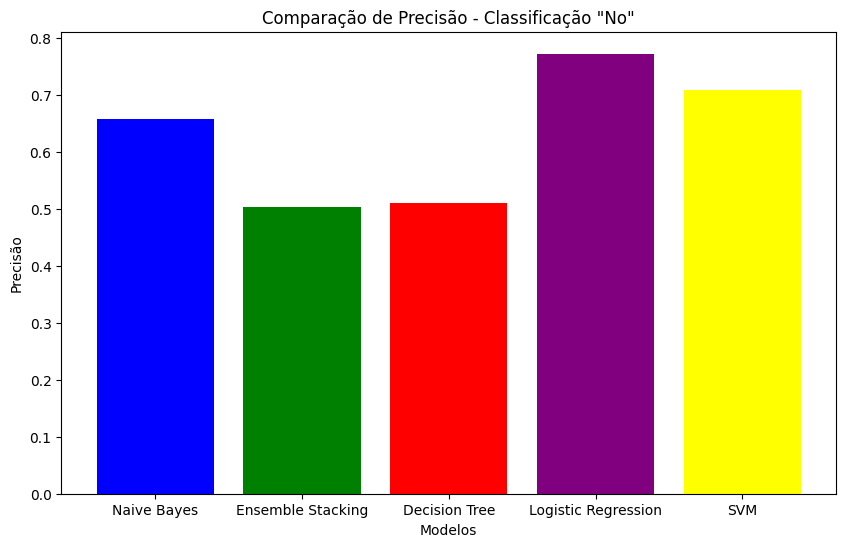

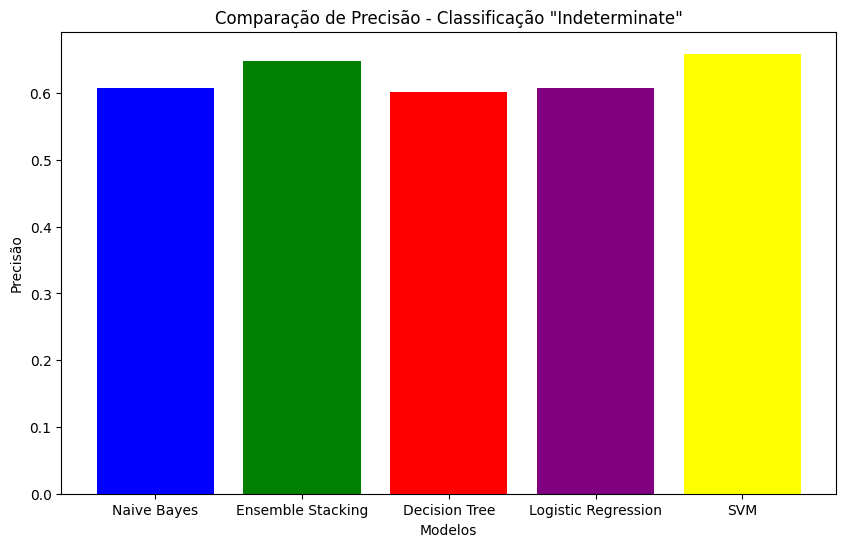

In [134]:
model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
precisions_0 = [precision_naivebayes_rf[0], precision_ensemblestacking_rf[0],\
              precision_decisiontree_rf[0], precision_logisticregression_rf[0], precision_svm_rf[0]]
precisions_1 = [precision_naivebayes_rf[1], precision_ensemblestacking_rf[1],\
              precision_decisiontree_rf[1], precision_logisticregression_rf[1], precision_svm_rf[1]]
precisions_2 = [precision_naivebayes_rf[2], precision_ensemblestacking_rf[2],\
              precision_decisiontree_rf[2], precision_logisticregression_rf[2], precision_svm_rf[2]]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### PCA

In [135]:
X_original = df_pca.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)


# substituir por 0 os valores null
X = X_original.select_dtypes(include=['number'])
X = X.fillna(0)
 
n_components = 9
pca = PCA(n_components=n_components)

# ajustar PCA aos dados 
X_pca = pca.fit_transform(X)
components = pca.components_


In [136]:
for i, component in enumerate(components):
    print(f"Características mais importantes no Componente Principal {i + 1}:")
    feature_indices = np.argsort(np.abs(component))[::-1]
    
    for j in feature_indices:
        feature_name = X.columns[j]
        feature_coefficient = component[j]
        print(f"{feature_name}: {feature_coefficient}")


Características mais importantes no Componente Principal 1:
original_glrlm_RunVariance: 0.2023824214476694
original_glrlm_LongRunEmphasis: 0.2023824214476694
original_glrlm_LongRunHighGrayLevelEmphasis: 0.2023824214476694
original_glrlm_LongRunLowGrayLevelEmphasis: 0.2023824214476694
original_glrlm_RunEntropy: 0.2023824214476694
original_glrlm_RunLengthNonUniformity: 0.2023824214476694
original_glrlm_RunLengthNonUniformityNormalized: 0.2023824214476694
original_glrlm_ShortRunEmphasis: 0.2023824214476694
original_glrlm_ShortRunHighGrayLevelEmphasis: 0.2023824214476694
original_glrlm_ShortRunLowGrayLevelEmphasis: 0.2023824214476694
original_shape_Sphericity: 0.20236017893169708
original_shape_SurfaceVolumeRatio: 0.20236017893169708
original_shape_SurfaceArea: 0.20236017893169708
original_gldm_SmallDependenceHighGrayLevelEmphasis: 0.20235911733861695
original_gldm_SmallDependenceLowGrayLevelEmphasis: 0.20235911733861695
original_gldm_SmallDependenceEmphasis: 0.20235911733861695
original_g

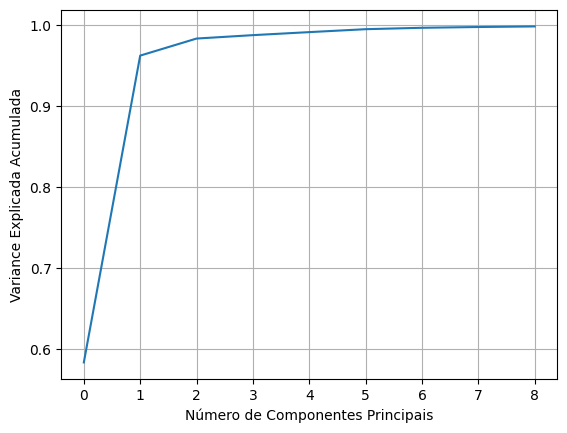

In [137]:
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()

plt.plot(cumulative_variance)
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Variance Explicada Acumulada')
plt.grid()
plt.show()

#### Naive Bayes

Accuracy: 37.34%
              precision    recall  f1-score   support

           0       0.32      0.86      0.46       103
           1       0.30      0.11      0.16       148
           2       0.51      0.32      0.40       231

    accuracy                           0.37       482
   macro avg       0.38      0.43      0.34       482
weighted avg       0.40      0.37      0.34       482



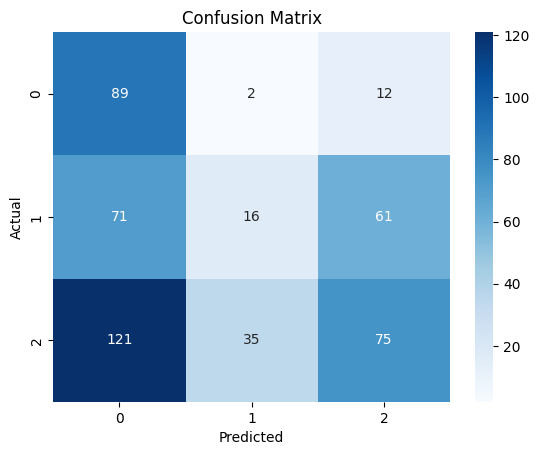

In [138]:

X = X_pca
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)

naive_bayes_model = GaussianNB()

naive_bayes_model.fit(X_train, y_train)
y_pred = naive_bayes_model.predict(X_test)

accuracy_naivebayes_pca = accuracy_score(y_test, y_pred)
precision_naivebayes_pca = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_naivebayes_pca * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

a alteração do random_state altera a accuracy porque(?)
estava com random_state=42

#### Ensemble Stacking

Accuracy: 49.38%
              precision    recall  f1-score   support

           0       0.61      0.68      0.64       103
           1       0.31      0.20      0.25       148
           2       0.51      0.60      0.55       231

    accuracy                           0.49       482
   macro avg       0.48      0.49      0.48       482
weighted avg       0.47      0.49      0.48       482



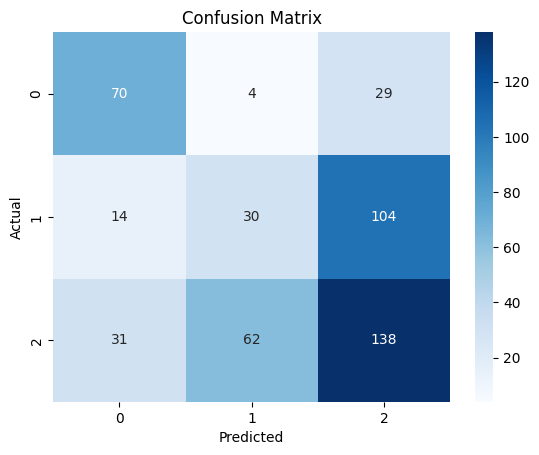

In [139]:
X = X_pca
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)

base_model1 = GaussianNB()
base_model2 = DecisionTreeClassifier(random_state=42)

meta_model = GaussianNB()

stacking_model = StackingClassifier(
    estimators=[('nb', base_model1), ('rf', base_model2)],
    final_estimator=meta_model
)

stacking_model.fit(X_train, y_train)

y_pred = stacking_model.predict(X_test)
accuracy_ensemblestacking_pca = accuracy_score(y_test, y_pred)
precision_ensemblestacking_pca = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_ensemblestacking_pca * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Decision Tree

Accuracy: 47.72%
              precision    recall  f1-score   support

           0       0.55      0.54      0.55       103
           1       0.37      0.35      0.36       148
           2       0.51      0.53      0.52       231

    accuracy                           0.48       482
   macro avg       0.48      0.47      0.48       482
weighted avg       0.48      0.48      0.48       482



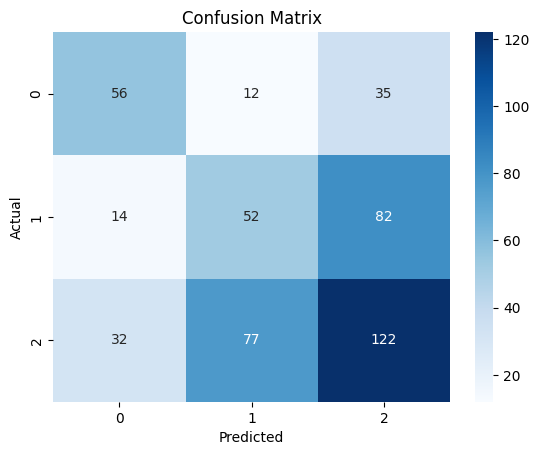

In [140]:
X = X_pca
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)
decision_tree_model = DecisionTreeClassifier(random_state=20)

decision_tree_model.fit(X_train, y_train)
y_pred = decision_tree_model.predict(X_test)

accuracy_decisiontree_pca = accuracy_score(y_test, y_pred)
precision_decisiontree_pca = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_decisiontree_pca * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Logistic Regression

C:\Users\maria\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 55.19%
              precision    recall  f1-score   support

           0       0.76      0.63      0.69       103
           1       0.33      0.16      0.21       148
           2       0.55      0.77      0.64       231

    accuracy                           0.55       482
   macro avg       0.54      0.52      0.51       482
weighted avg       0.52      0.55      0.52       482



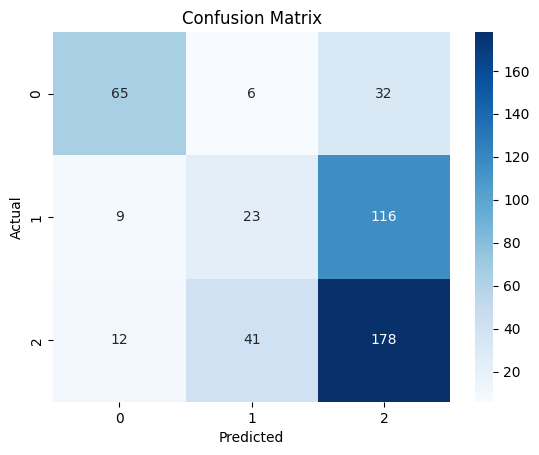

In [141]:
X = X_pca
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)
logistic_model = LogisticRegression()

logistic_model.fit(X_train, y_train)
y_pred = logistic_model.predict(X_test)

accuracy_logisticregression_pca = accuracy_score(y_test, y_pred)
precision_logisticregression_pca = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_logisticregression_pca * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### SVM

Accuracy: 54.56%
              precision    recall  f1-score   support

           0       0.79      0.44      0.56       103
           1       0.33      0.05      0.09       148
           2       0.52      0.91      0.66       231

    accuracy                           0.55       482
   macro avg       0.55      0.47      0.44       482
weighted avg       0.52      0.55      0.47       482



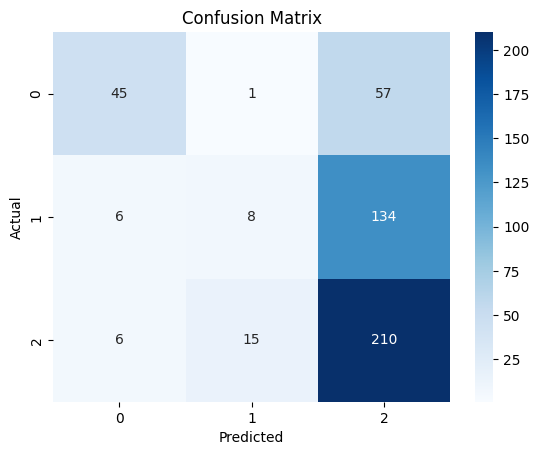

In [142]:
X = X_pca
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)

clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy_svm_pca = accuracy_score(y_test, y_pred)
precision_svm_pca = precision_score(y_test, y_pred, average=None)
print("Accuracy: {:.2f}%".format(accuracy_svm_pca * 100))
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

#### Accuracy

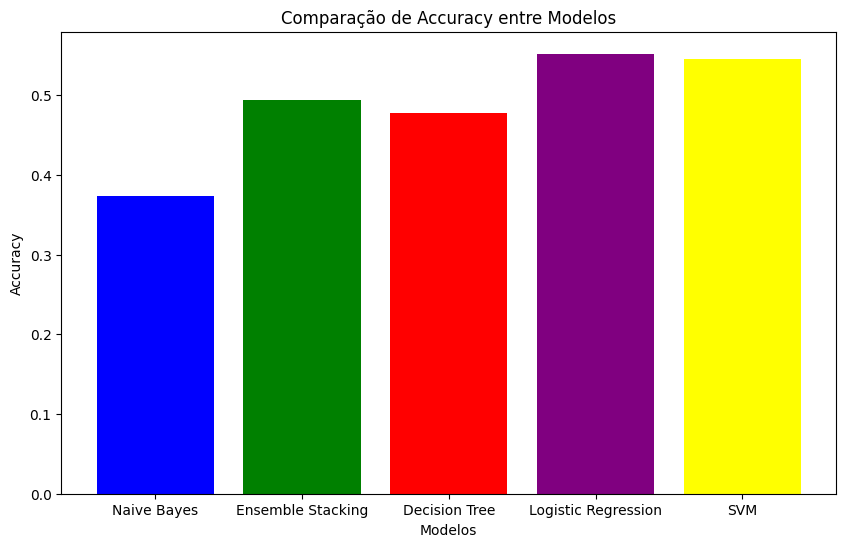

In [143]:
model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
accuracies = [accuracy_naivebayes_pca, accuracy_ensemblestacking_pca,\
              accuracy_decisiontree_pca, accuracy_logisticregression_pca, accuracy_svm_pca]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple','yellow'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

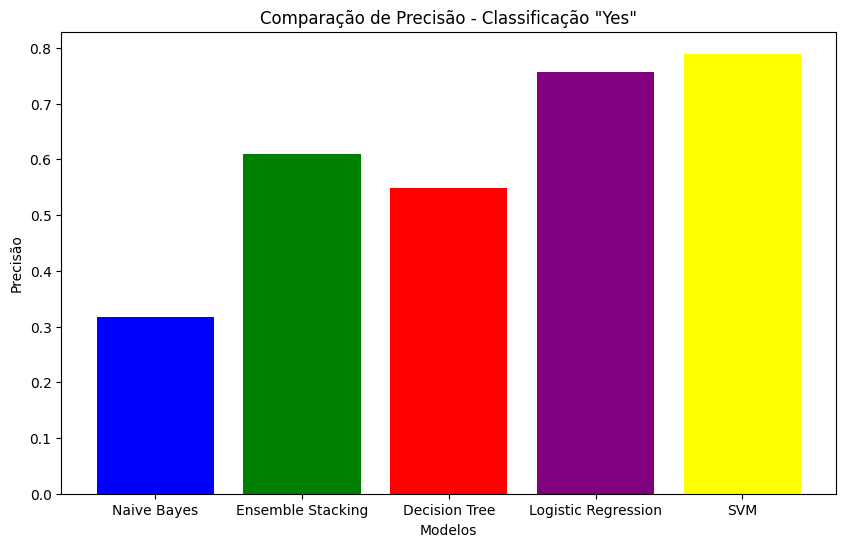

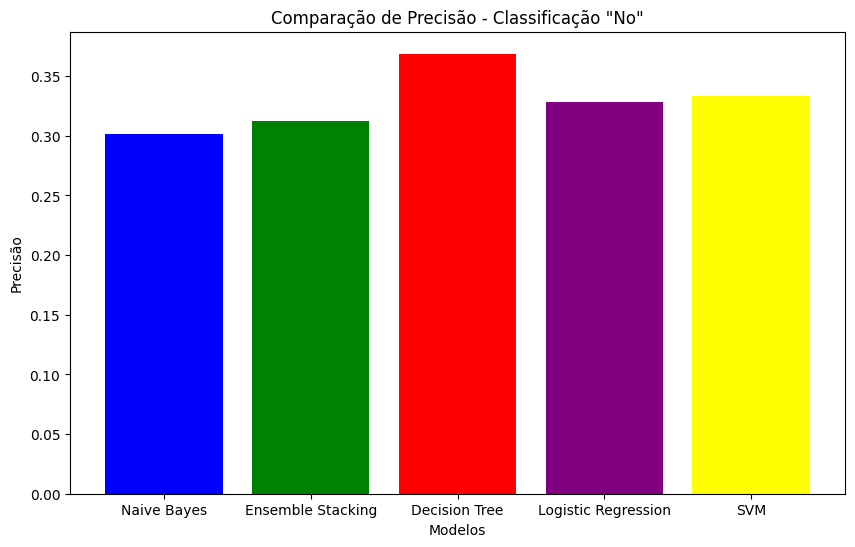

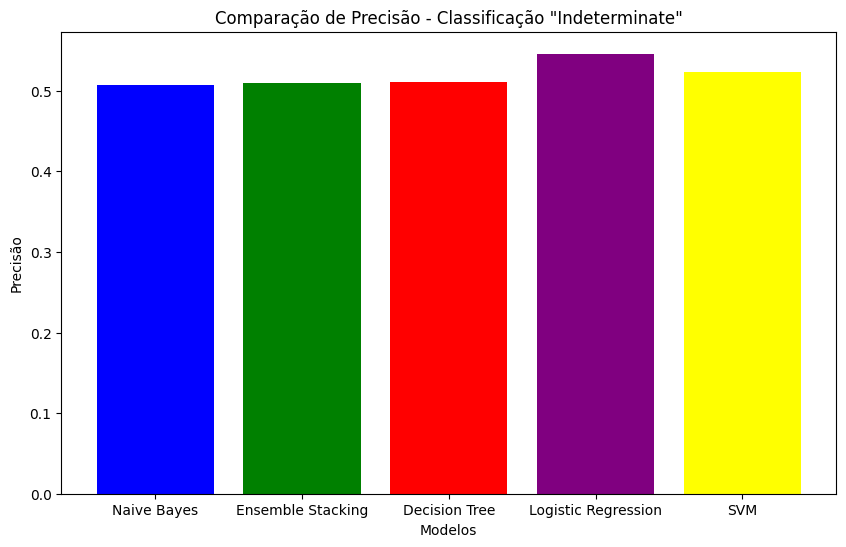

In [144]:
model_names = ['Naive Bayes', 'Ensemble Stacking', 'Decision Tree', 'Logistic Regression', 'SVM']
precisions_0 = [precision_naivebayes_pca[0], precision_ensemblestacking_pca[0],\
              precision_decisiontree_pca[0], precision_logisticregression_pca[0], precision_svm_pca[0]]
precisions_1 = [precision_naivebayes_pca[1], precision_ensemblestacking_pca[1],\
              precision_decisiontree_pca[1], precision_logisticregression_pca[1], precision_svm_pca[1]]
precisions_2 = [precision_naivebayes_pca[2], precision_ensemblestacking_pca[2],\
              precision_decisiontree_pca[2], precision_logisticregression_pca[2], precision_svm_pca[2]]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

## Comparação de resultados

### Modelos Naive Bayes

#### Accuracy

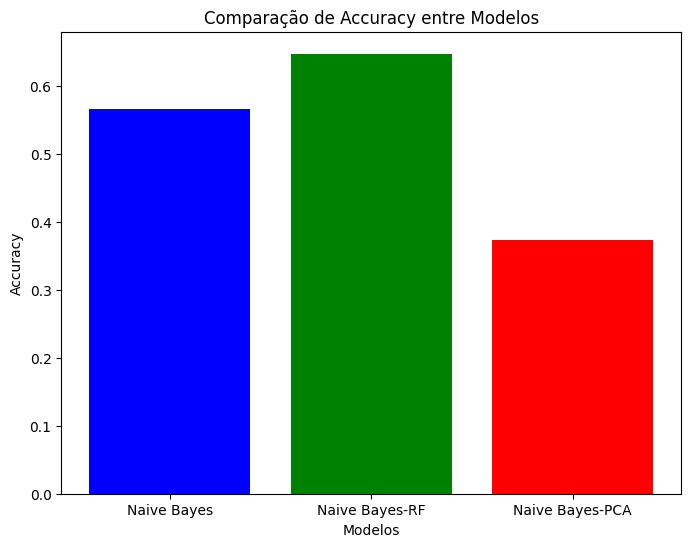

In [145]:
model_names = ['Naive Bayes', 'Naive Bayes-RF', 'Naive Bayes-PCA']
accuracies = [accuracy_naivebayes, accuracy_naivebayes_rf, accuracy_naivebayes_pca]

plt.figure(figsize=(8, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

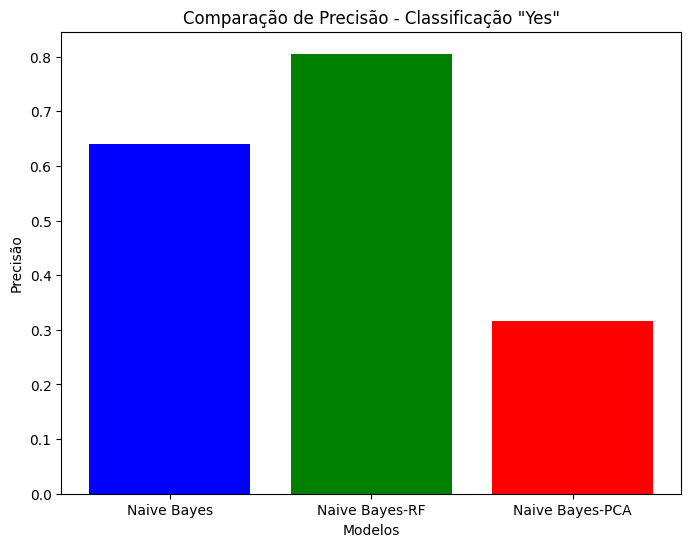

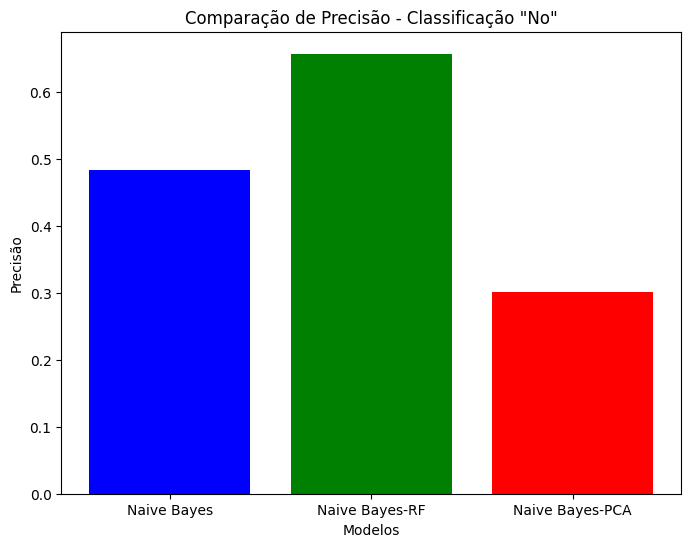

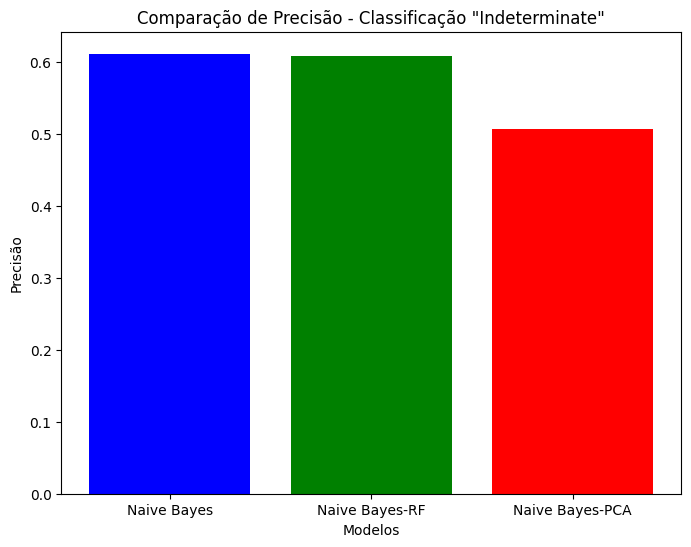

In [146]:
model_names = ['Naive Bayes', 'Naive Bayes-RF', 'Naive Bayes-PCA']
precisions_0 = [precision_naivebayes[0], precision_naivebayes_rf[0], precision_naivebayes_pca[0]]
precisions_1 = [precision_naivebayes[1], precision_naivebayes_rf[1], precision_naivebayes_pca[1]]
precisions_2 = [precision_naivebayes[2], precision_naivebayes_rf[2], precision_naivebayes_pca[2]]

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### Modelos Ensemble Stacking

#### Accuracy

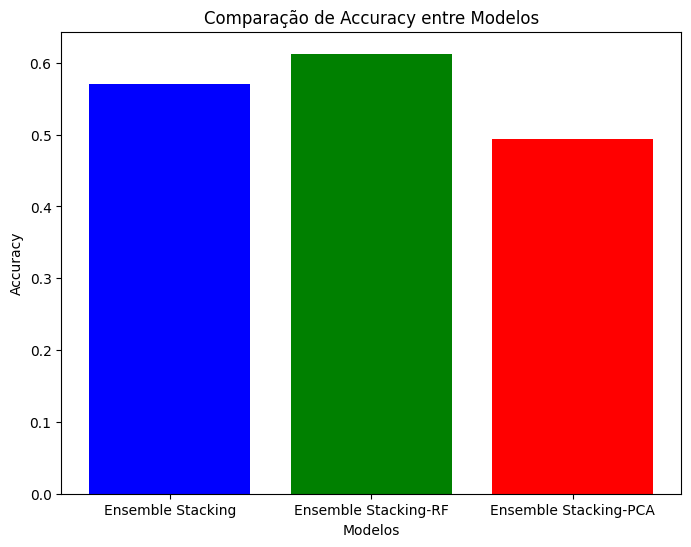

In [147]:
model_names = ['Ensemble Stacking', 'Ensemble Stacking-RF', 'Ensemble Stacking-PCA']
accuracies = [accuracy_ensemblestacking, accuracy_ensemblestacking_rf, accuracy_ensemblestacking_pca]

plt.figure(figsize=(8, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

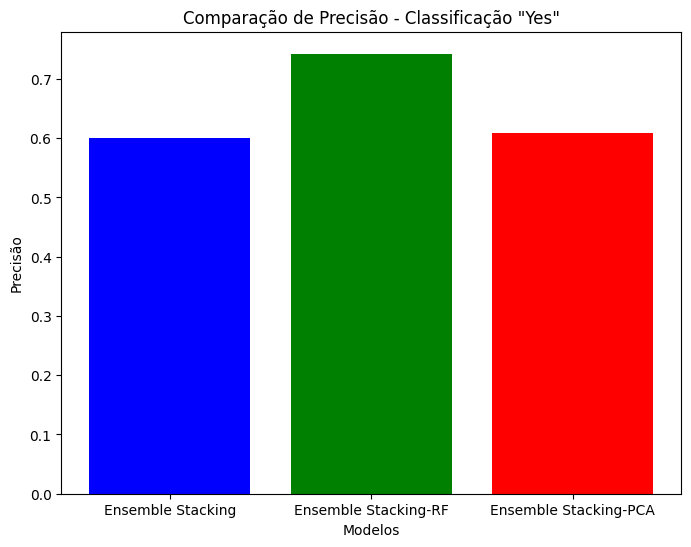

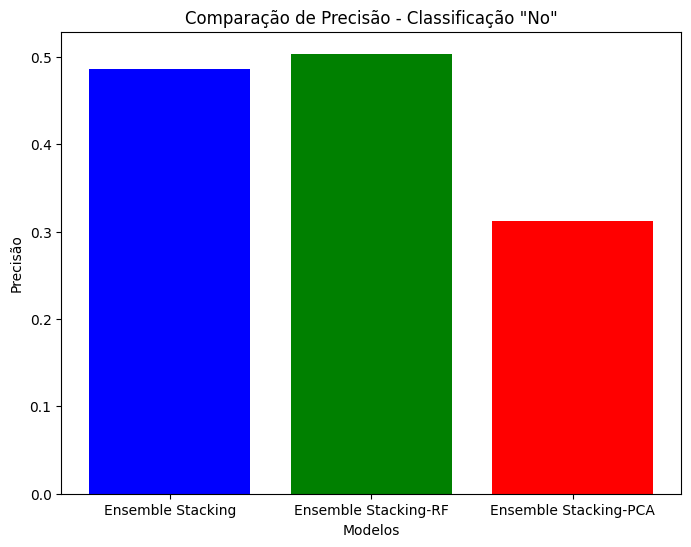

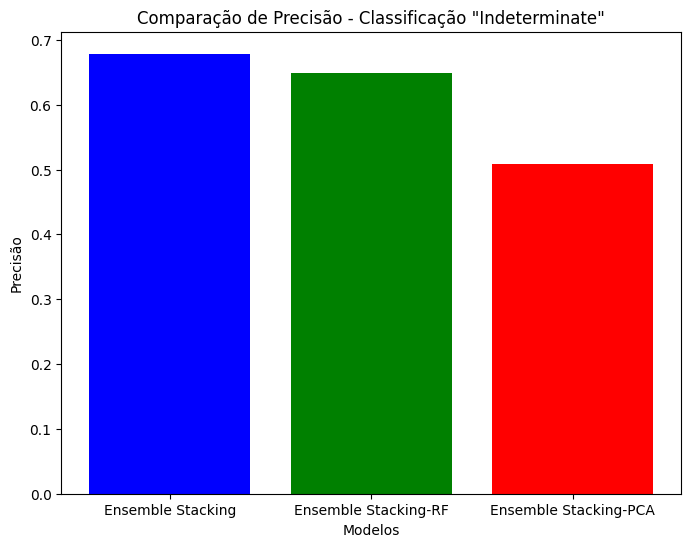

In [148]:
model_names = ['Ensemble Stacking', 'Ensemble Stacking-RF', 'Ensemble Stacking-PCA']
precisions_0 = [precision_ensemblestacking[0], precision_ensemblestacking_rf[0], precision_ensemblestacking_pca[0]]
precisions_1 = [precision_ensemblestacking[1], precision_ensemblestacking_rf[1], precision_ensemblestacking_pca[1]]
precisions_2 = [precision_ensemblestacking[2], precision_ensemblestacking_rf[2], precision_ensemblestacking_pca[2]]

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### Modelos Decision Tree

#### Accuracy

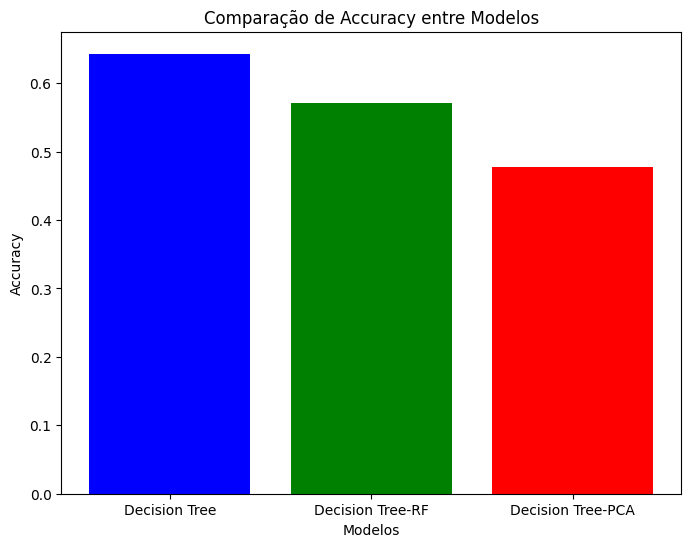

In [149]:
model_names = ['Decision Tree', 'Decision Tree-RF', 'Decision Tree-PCA']
accuracies = [accuracy_decisiontree, accuracy_decisiontree_rf, accuracy_decisiontree_pca]

plt.figure(figsize=(8, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

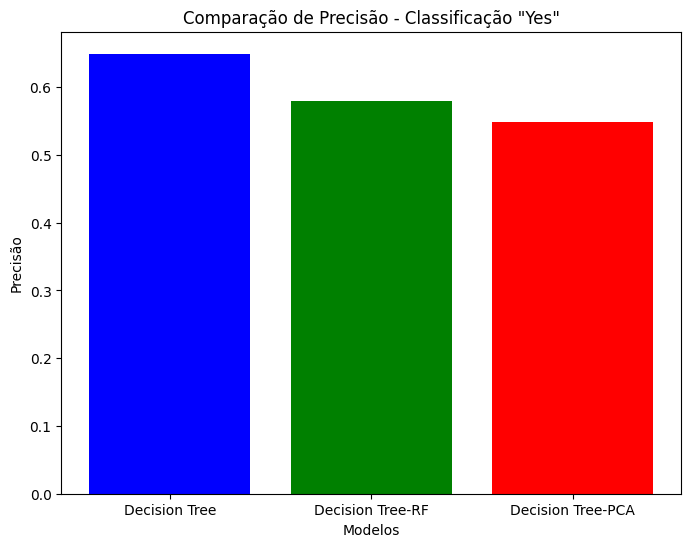

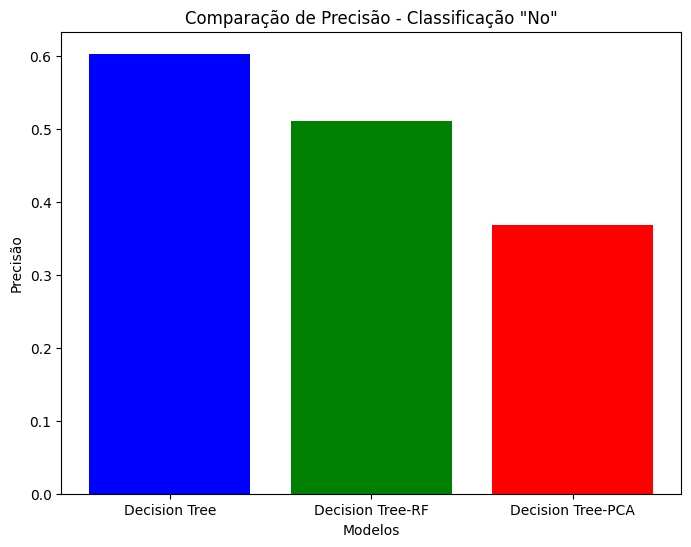

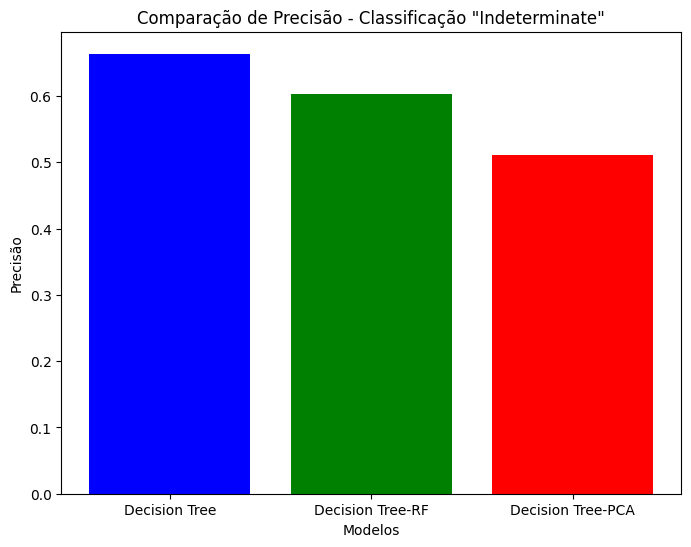

In [150]:
model_names = ['Decision Tree', 'Decision Tree-RF', 'Decision Tree-PCA']
precisions_0 = [precision_decisiontree[0], precision_decisiontree_rf[0], precision_decisiontree_pca[0]]
precisions_1 = [precision_decisiontree[1], precision_decisiontree_rf[1], precision_decisiontree_pca[1]]
precisions_2 = [precision_decisiontree[2], precision_decisiontree_rf[2], precision_decisiontree_pca[2]]

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### Modelos Logistic Regression

#### Accuracy

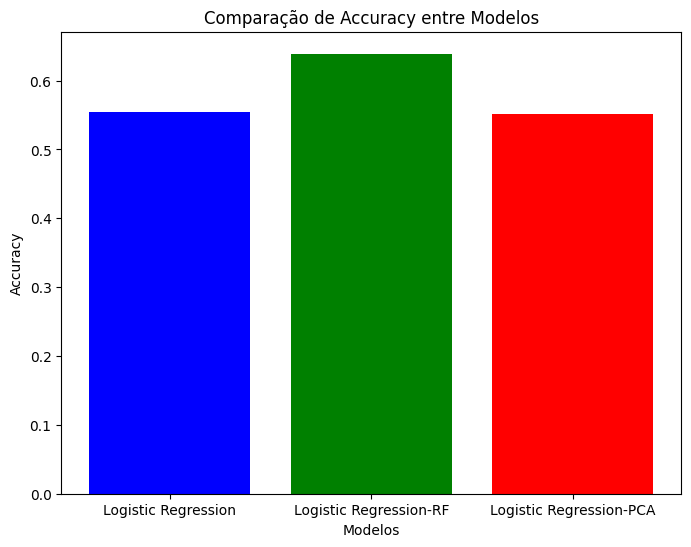

In [151]:
model_names = ['Logistic Regression', 'Logistic Regression-RF', 'Logistic Regression-PCA']
accuracies = [accuracy_logisticregression, accuracy_logisticregression_rf, accuracy_logisticregression_pca]

plt.figure(figsize=(8, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

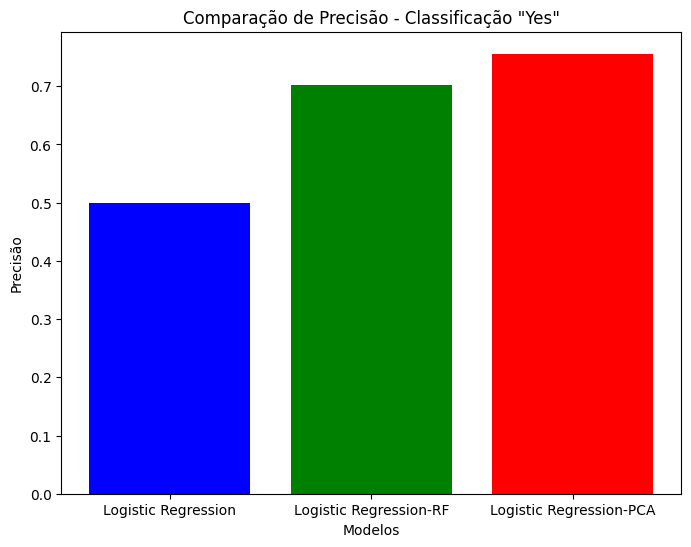

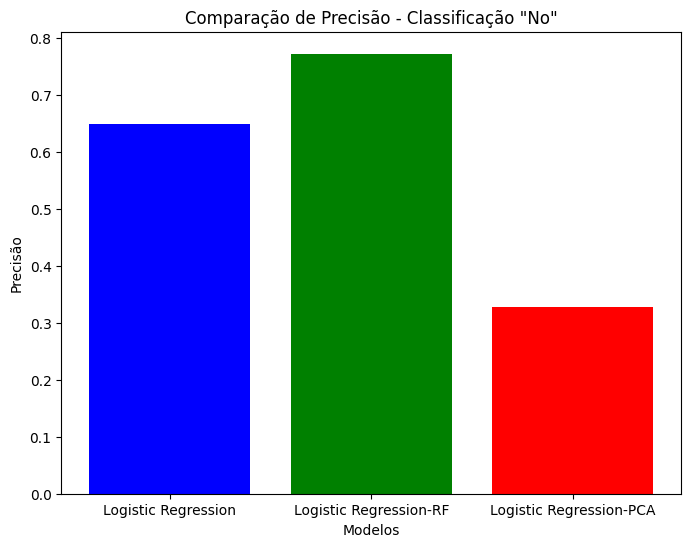

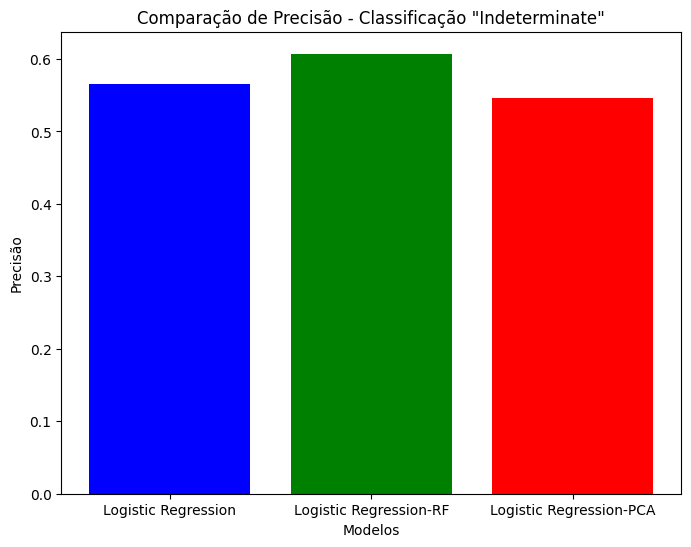

In [152]:
model_names = ['Logistic Regression', 'Logistic Regression-RF', 'Logistic Regression-PCA']
precisions_0 = [precision_logisticregression[0], precision_logisticregression_rf[0], precision_logisticregression_pca[0]]
precisions_1 = [precision_logisticregression[1], precision_logisticregression_rf[1], precision_logisticregression_pca[1]]
precisions_2 = [precision_logisticregression[2], precision_logisticregression_rf[2], precision_logisticregression_pca[2]]

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### Modelos SVM

#### Accuracy

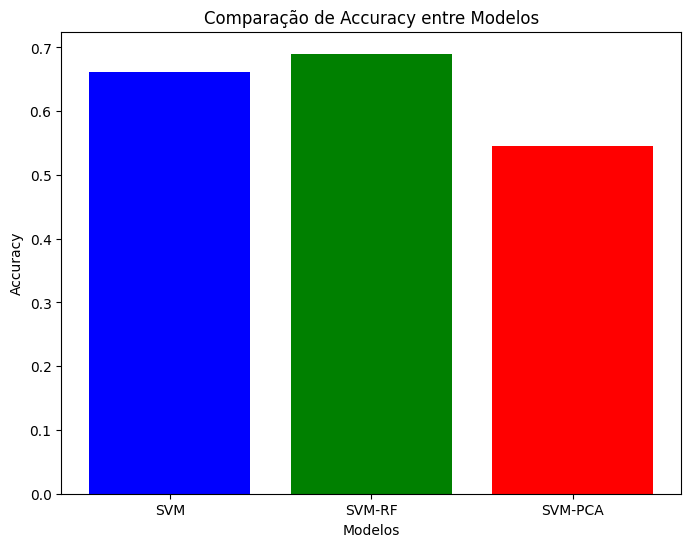

In [153]:
model_names = ['SVM', 'SVM-RF', 'SVM-PCA']
accuracies = [accuracy_svm, accuracy_svm_rf, accuracy_svm_pca]

plt.figure(figsize=(8, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

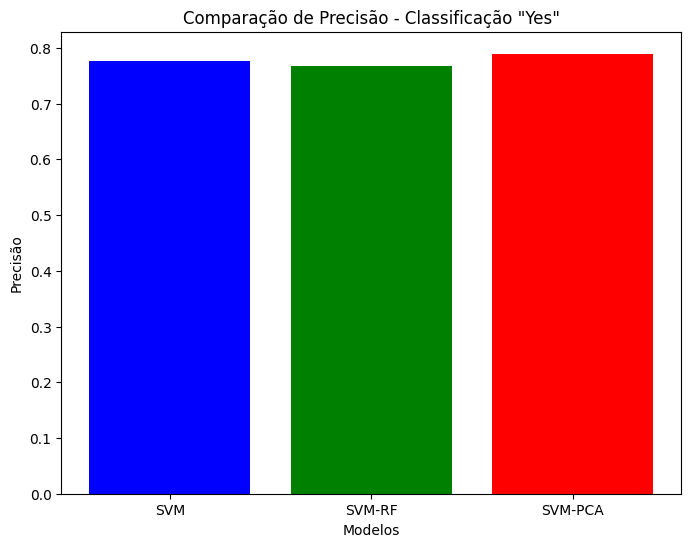

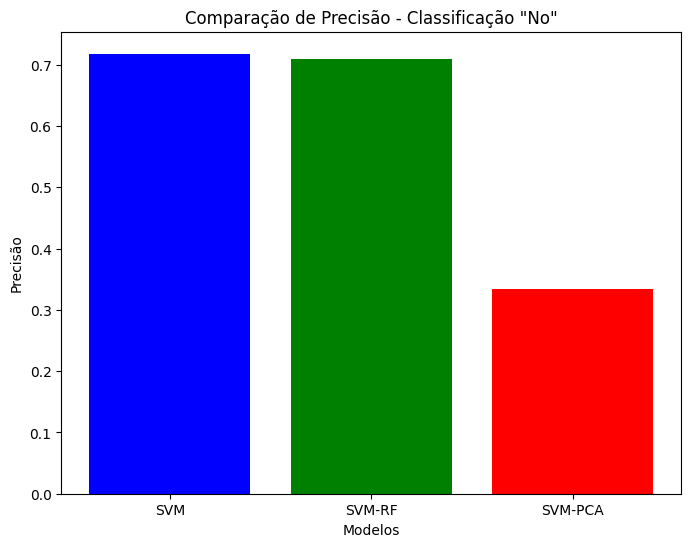

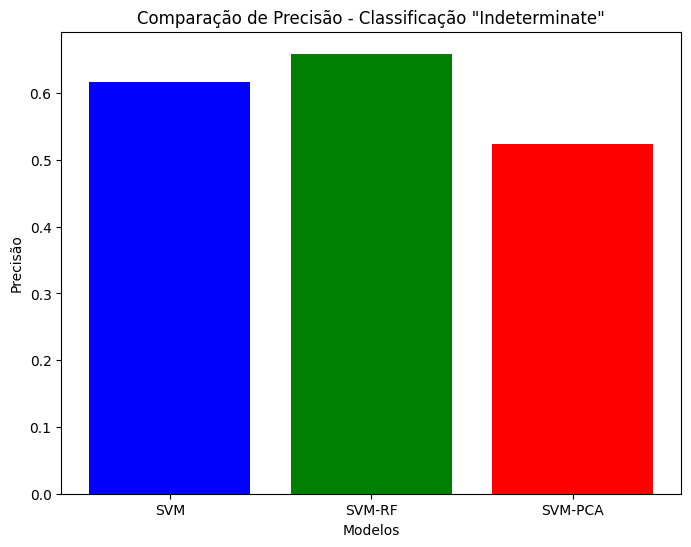

In [154]:
model_names = ['SVM', 'SVM-RF', 'SVM-PCA']
precisions_0 = [precision_svm[0], precision_svm_rf[0], precision_svm_pca[0]]
precisions_1 = [precision_svm[1], precision_svm_rf[1], precision_svm_pca[1]]
precisions_2 = [precision_svm[2], precision_svm_rf[2], precision_svm_pca[2]]

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()

plt.figure(figsize=(8, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### Best Naive Bayes VS Best Ensemble Stacking VS Best Decision Tree Vs Best Logistic Regression VS Best SVM

#### Accuracy

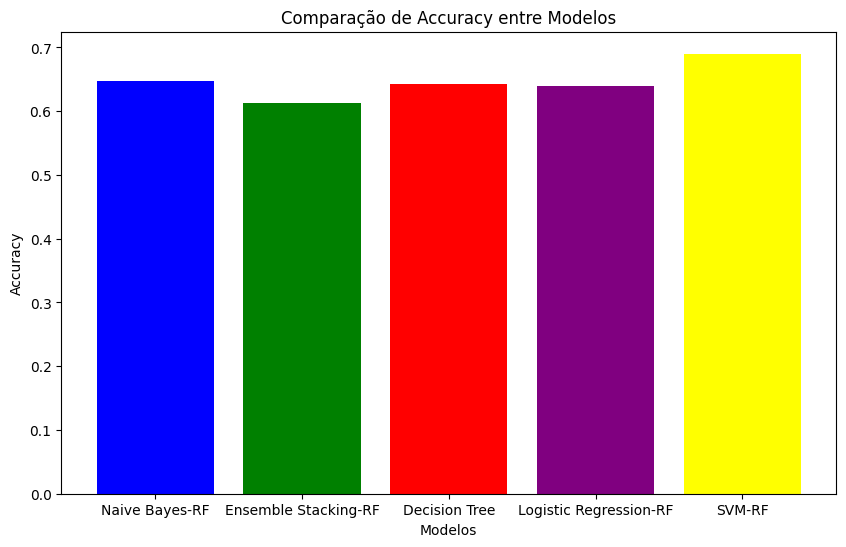

In [165]:
names_naivebayes = ["Naive Bayes", "Naive Bayes-RF", "Naive Bayes-PCA"]
accuracy_best_naivebayes = max(accuracy_naivebayes, accuracy_naivebayes_rf, accuracy_naivebayes_pca)
index_of_best_accuracy = [accuracy_naivebayes, accuracy_naivebayes_rf, accuracy_naivebayes_pca].index(accuracy_best_naivebayes)
best_name_naivebayes = names_naivebayes[index_of_best_accuracy]

names_ensemblestacking = ["Ensemble Stacking", "Ensemble Stacking-RF", "Ensemble Stacking-PCA"]
accuracy_best_ensemblestacking = max(accuracy_ensemblestacking, accuracy_ensemblestacking_rf, accuracy_ensemblestacking_pca)
index_of_best_accuracy = [accuracy_ensemblestacking, accuracy_ensemblestacking_rf, accuracy_ensemblestacking_pca].index(accuracy_best_ensemblestacking)
best_name_ensemblestacking = names_ensemblestacking[index_of_best_accuracy]

names_decisiontree = ["Decision Tree", "Decision Tree-RF", "Decision Tree-PCA"]
accuracy_best_decisiontree = max(accuracy_decisiontree, accuracy_decisiontree_rf, accuracy_decisiontree_pca)
index_of_best_accuracy = [accuracy_decisiontree, accuracy_decisiontree_rf, accuracy_decisiontree_pca].index(accuracy_best_decisiontree)
best_name_decisiontree = names_decisiontree[index_of_best_accuracy]

names_logisticregression = ["Logistic Regression", "Logistic Regression-RF", "Logistic Regression-PCA"]
accuracy_best_logisticregression = max(accuracy_logisticregression, accuracy_logisticregression_rf, accuracy_logisticregression_pca)
index_of_best_accuracy = [accuracy_logisticregression, accuracy_logisticregression_rf, accuracy_logisticregression_pca].index(accuracy_best_logisticregression)
best_name_logisticregression = names_logisticregression[index_of_best_accuracy]

names_svm = ["SVM", "SVM-RF", "SVM-PCA"]
accuracy_best_svm = max(accuracy_svm, accuracy_svm_rf, accuracy_svm_pca)
index_of_best_accuracy = [accuracy_svm, accuracy_svm_rf, accuracy_svm_pca].index(accuracy_best_svm)
best_name_svm = names_svm[index_of_best_accuracy]

model_names = [best_name_naivebayes, best_name_ensemblestacking, best_name_decisiontree, best_name_logisticregression, best_name_svm]
accuracies = [accuracy_best_naivebayes, accuracy_best_ensemblestacking, accuracy_best_decisiontree, accuracy_best_logisticregression, accuracy_best_svm]

plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple','yellow'])


plt.xlabel('Modelos')
plt.ylabel('Accuracy')
plt.title('Comparação de Accuracy entre Modelos')

plt.show()

#### Precisão

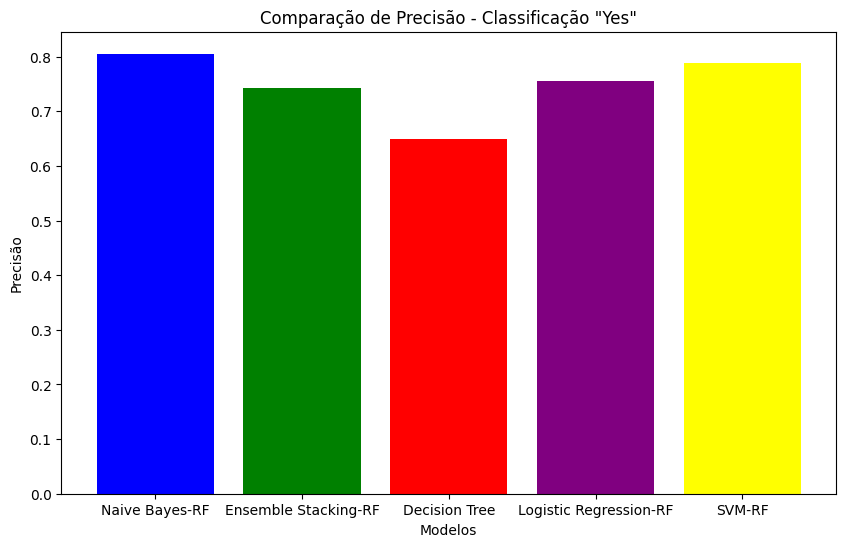

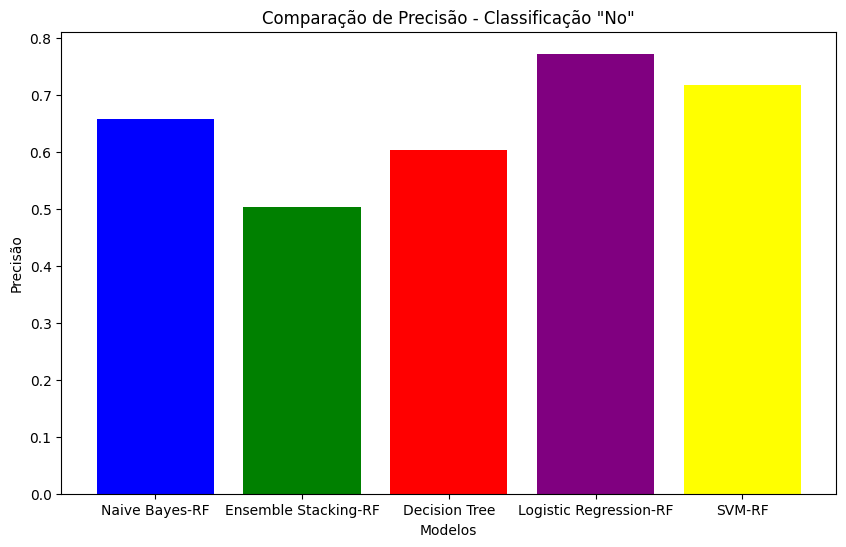

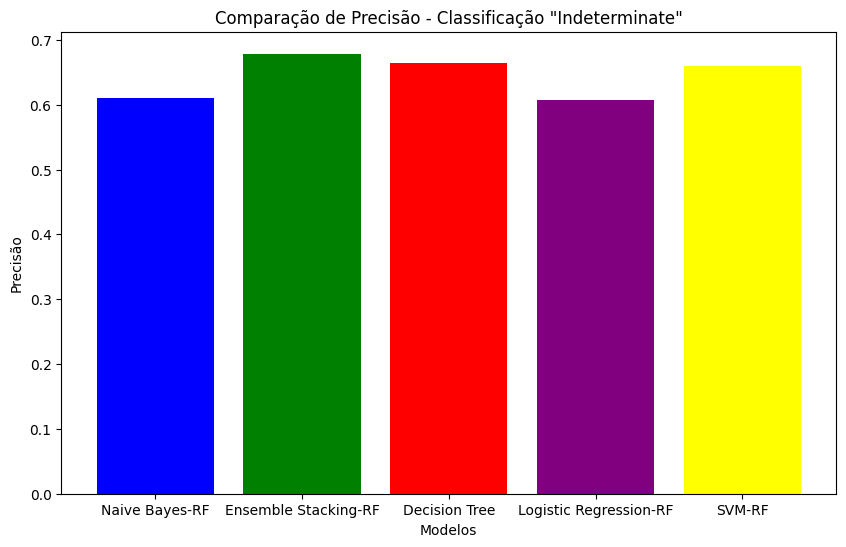

In [168]:
names_naivebayes = ["Naive Bayes", "Naive Bayes-RF", "Naive Bayes-PCA"]
precision0_best_naivebayes = max(precision_naivebayes[0], precision_naivebayes_rf[0], precision_naivebayes_pca[0])
index_of_best_precision0 = [precision_naivebayes[0], precision_naivebayes_rf[0], precision_naivebayes_pca[0]].index(precision0_best_naivebayes)
best_name_naivebayes0 = names_naivebayes[index_of_best_precision0]

precision1_best_naivebayes = max(precision_naivebayes[1], precision_naivebayes_rf[1], precision_naivebayes_pca[1])
index_of_best_precision1 = [precision_naivebayes[1], precision_naivebayes_rf[1], precision_naivebayes_pca[1]].index(precision1_best_naivebayes)
best_name_naivebayes1 = names_naivebayes[index_of_best_precision1]

precision2_best_naivebayes = max(precision_naivebayes[2], precision_naivebayes_rf[2], precision_naivebayes_pca[2])
index_of_best_precision2 = [precision_naivebayes[2], precision_naivebayes_rf[2], precision_naivebayes_pca[2]].index(precision2_best_naivebayes)
best_name_naivebayes2 = names_naivebayes[index_of_best_precision2]


names_ensemblestacking = ["Ensemble Stacking", "Ensemble Stacking-RF", "Ensemble Stacking-PCA"]
precision0_best_ensemblestacking = max(precision_ensemblestacking[0], precision_ensemblestacking_rf[0], precision_ensemblestacking_pca[0])
index_of_best_precision0 = [precision_ensemblestacking[0], precision_ensemblestacking_rf[0], precision_ensemblestacking_pca[0]].index(precision0_best_ensemblestacking)
best_name_ensemblestacking0 = names_ensemblestacking[index_of_best_precision0]

precision1_best_ensemblestacking = max(precision_ensemblestacking[1], precision_ensemblestacking_rf[1], precision_ensemblestacking_pca[1])
index_of_best_precision1 = [precision_ensemblestacking[1], precision_ensemblestacking_rf[1], precision_ensemblestacking_pca[1]].index(precision1_best_ensemblestacking)
best_name_ensemblestacking1 = names_ensemblestacking[index_of_best_precision1]

precision2_best_ensemblestacking = max(precision_ensemblestacking[2], precision_ensemblestacking_rf[2], precision_ensemblestacking_pca[2])
index_of_best_precision2 = [precision_ensemblestacking[2], precision_ensemblestacking_rf[2], precision_ensemblestacking_pca[2]].index(precision2_best_ensemblestacking)
best_name_ensemblestacking2 = names_ensemblestacking[index_of_best_precision2]


names_decisiontree = ["Decision Tree", "Decision Tree-RF", "Decision Tree-PCA"]
precision0_best_decisiontree = max(precision_decisiontree[0], precision_decisiontree_rf[0], precision_decisiontree_pca[0])
index_of_best_precision0 = [precision_decisiontree[0], precision_decisiontree_rf[0], precision_decisiontree_pca[0]].index(precision0_best_decisiontree)
best_name_decisiontree0 = names_decisiontree[index_of_best_precision0]

precision1_best_decisiontree = max(precision_decisiontree[1], precision_decisiontree_rf[1], precision_decisiontree_pca[1])
index_of_best_precision1 = [precision_decisiontree[1], precision_decisiontree_rf[1], precision_decisiontree_pca[1]].index(precision1_best_decisiontree)
best_name_decisiontree1 = names_decisiontree[index_of_best_precision1]

precision2_best_decisiontree = max(precision_decisiontree[2], precision_decisiontree_rf[2], precision_decisiontree_pca[2])
index_of_best_precision2 = [precision_decisiontree[2], precision_decisiontree_rf[2], precision_decisiontree_pca[2]].index(precision2_best_decisiontree)
best_name_decisiontree2 = names_decisiontree[index_of_best_precision2]


names_logisticregression = ["Logistic Regression", "Logistic Regression-RF", "Logistic Regression-PCA"]
precision0_best_logisticregression = max(precision_logisticregression[0], precision_logisticregression_rf[0], precision_logisticregression_pca[0])
index_of_best_precision0 = [precision_logisticregression[0], precision_logisticregression_rf[0], precision_logisticregression_pca[0]].index(precision0_best_logisticregression)
best_name_logisticregression0 = names_logisticregression[index_of_best_precision0]

precision1_best_logisticregression = max(precision_logisticregression[1], precision_logisticregression_rf[1], precision_logisticregression_pca[1])
index_of_best_precision1 = [precision_logisticregression[1], precision_logisticregression_rf[1], precision_logisticregression_pca[1]].index(precision1_best_logisticregression)
best_name_logisticregression1 = names_logisticregression[index_of_best_precision1]

precision2_best_logisticregression = max(precision_logisticregression[2], precision_logisticregression_rf[2], precision_logisticregression_pca[2])
index_of_best_precision2 = [precision_logisticregression[2], precision_logisticregression_rf[2], precision_logisticregression_pca[2]].index(precision2_best_logisticregression)
best_name_logisticregression2 = names_logisticregression[index_of_best_precision2]


names_svm = ["SVM", "SVM-RF", "SVM-PCA"]
precision0_best_svm = max(precision_svm[0], precision_svm_rf[0], precision_svm_pca[0])
index_of_best_precision0 = [precision_svm[0], precision_svm_rf[0], precision_svm_pca[0]].index(precision0_best_svm)
best_name_svm0 = names_svm[index_of_best_precision0]

precision1_best_svm = max(precision_svm[1], precision_svm_rf[1], precision_svm_pca[1])
index_of_best_precision1 = [precision_svm[1], precision_svm_rf[1], precision_svm_pca[1]].index(precision1_best_svm)
best_name_svm1 = names_svm[index_of_best_precision1]

precision2_best_svm = max(precision_svm[2], precision_svm_rf[2], precision_svm_pca[2])
index_of_best_precision2 = [precision_svm[2], precision_svm_rf[2], precision_svm_pca[2]].index(precision2_best_svm)
best_name_svm2 = names_svm[index_of_best_precision2]


model_names0 = [best_name_naivebayes0, best_name_ensemblestacking0, best_name_decisiontree0, best_name_logisticregression0, best_name_svm0]
precisions_0 = [precision0_best_naivebayes, precision0_best_ensemblestacking,\
                precision0_best_decisiontree, precision0_best_logisticregression, precision0_best_svm]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_0, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Yes"')

plt.show()


model_names1 = [best_name_naivebayes1, best_name_ensemblestacking1, best_name_decisiontree1, best_name_logisticregression1, best_name_svm1]
precisions_1 = [precision1_best_naivebayes, precision1_best_ensemblestacking, precision1_best_decisiontree, precision1_best_logisticregression, precision1_best_svm]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_1, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "No"')

plt.show()


model_names2 = [best_name_naivebayes2, best_name_ensemblestacking2, best_name_decisiontree2, best_name_logisticregression2, best_name_svm2]
precisions_2 = [precision2_best_naivebayes, precision2_best_ensemblestacking, precision2_best_decisiontree, precision2_best_logisticregression, precision2_best_svm]

plt.figure(figsize=(10, 6))
plt.bar(model_names, precisions_2, color=['blue', 'green', 'red', 'purple','yellow'])

plt.xlabel('Modelos')
plt.ylabel('Precisão')
plt.title('Comparação de Precisão - Classificação "Indeterminate"')

plt.show()

### ROC Curve Logistic Regression-PCA

### Testagens

#### Numero de Componentes vs Accuracy

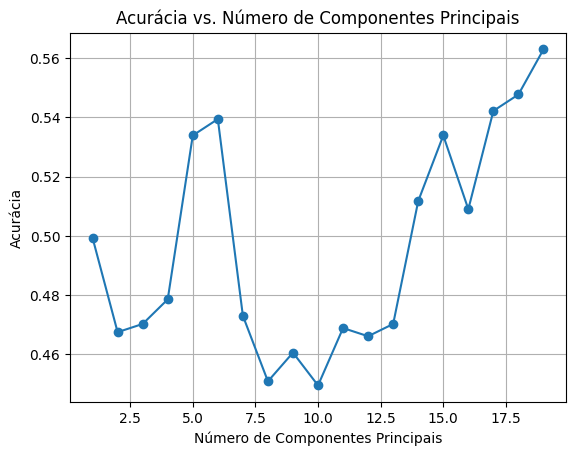

In [169]:

X_original = df.drop(['Target', 'Malignancy', 'Nodulo_id'], axis=1)


X = X_original.select_dtypes(include=['number'])

X = X.fillna(0)  
y = df['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=20)

# armazenar accuracies
accuracies = []

for n_components in range(1, 20):  
    pca = PCA(n_components=n_components)

    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    naive_bayes_model = GaussianNB()

    
    naive_bayes_model.fit(X_train_pca, y_train)

    y_pred = naive_bayes_model.predict(X_test_pca)

    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)

plt.plot(range(1, 20), accuracies, marker='o')
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Acurácia')
plt.title('Acurácia vs. Número de Componentes Principais')
plt.grid()
plt.show()


In [170]:
def plot_ds2D(X,y):
    sns.scatterplot(x=X['Calcification'],y=X['Target'],hue=y,palette="deep")
    plt.show()

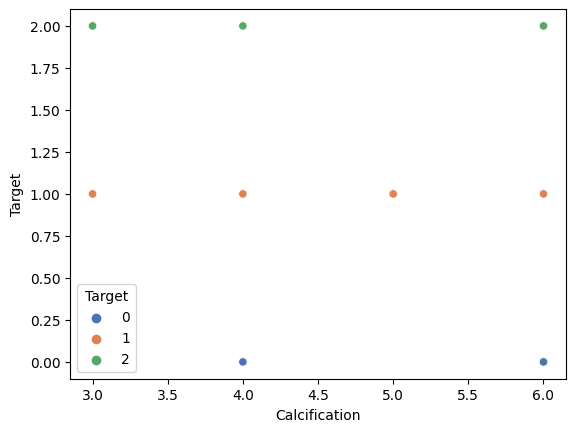

In [171]:
X_original = df
X = X_original.select_dtypes(include=['number', 'object'])
y = df['Target']
plot_ds2D(X,y)

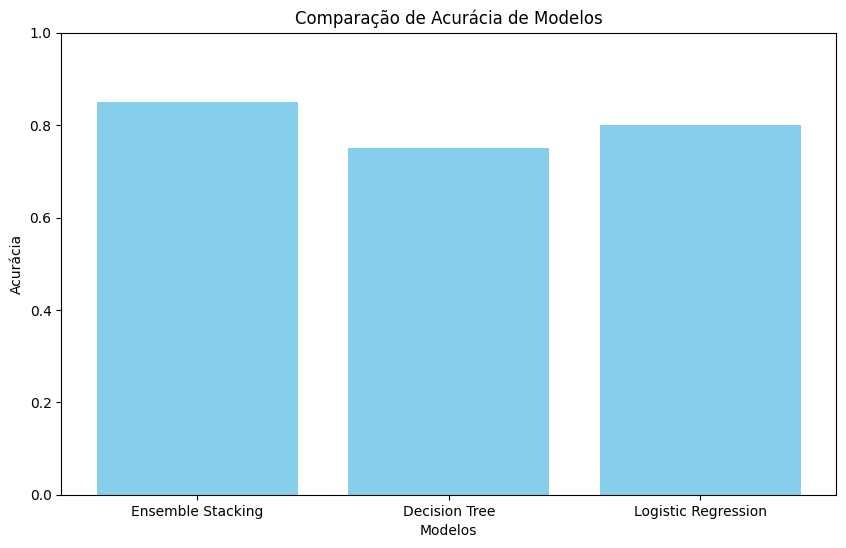

In [172]:
import matplotlib.pyplot as plt

# Acurácia dos modelos
accuracy_svm = 0.85  # Substitua pelo valor real da acurácia do modelo SVM
accuracy_decision_tree = 0.75  # Substitua pelo valor real da acurácia do modelo de Árvore de Decisão
accuracy_logistic_regression = 0.80  # Substitua pelo valor real da acurácia do modelo de Regressão Logística

# Nomes dos modelos
model_names = ['Ensemble Stacking', 'Decision Tree', 'Logistic Regression']

# Valores de acurácia
accuracy_values = [accuracy_svm, accuracy_decision_tree, accuracy_logistic_regression]

# Crie um gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracy_values, color='skyblue')
plt.xlabel('Modelos')
plt.ylabel('Acurácia')
plt.title('Comparação de Acurácia de Modelos')
plt.ylim(0, 1)  # Defina o intervalo do eixo y (0 a 1 para acurácia)
plt.show()


In [173]:
n_component=5
pca=PCA(n_components=n_component)
X_pca=pca.fit_transform(X)
components = pca.components_

In [174]:
X=df_pca
pca = PCA()
pca.fit(X)
variance_explained = pca.explained_variance_ratio_

plt.plot(range(1, len(variance_explained) + 1), variance_explained, marker='o')
plt.xlabel('Número de Componentes Principais')
plt.ylabel('Variância Explicada')
plt.title('Gráfico de Cotovelo (Elbow Plot)')
plt.grid(True)
plt.show()


ValueError: could not convert string to float: 'v3.1.0'